> Note: This reprot inculdes three parts,
> - Connectivity and Modularity: Trends and Thematic Dynamics in the Music Network on Top-100 selling albums from 1960 to 2023 (Sitong Chen 230027)
> - (Daniel Diamant s205336)
> - Top 100 songs between 2000 and 2020 (Patrick Jensen Martins s204748)

# **Connectivity and Modularity: Trends and Thematic Dynamics in the Music Network on Top-100 selling albums from 1960 to 2023**

**Author: Sitong Chen (s230027)**

## **Introduction**

The evolution of the music industry is shaped by a dynamic interplay of cultural, technological, and artistic forces. While traditional music analysis often emphasizes metrics such as sales figures or the emotional tone of individual works, it frequently overlooks the intricate relationships between albums and their broader impact on the industry's evolution.

This study seeks to bridge that gap by introducing a novel framework for understanding these connections. By modeling the top 100 best-selling albums from each year between 1960 and 2023 as a complex network, we aim to explore how musical styles, themes, and influences are interconnected over time.

## **Data Collection**

The dataset for this study was constructed from multiple reliable sources to ensure comprehensiveness and accuracy. The top 100 best-selling albums from each year between 1960 and 2023 were collected from the [Digital Dream Door website](https://digitaldreamdoor.com/). Album track names were retrieved using the [MusicBrainz API](https://musicbrainz.org/), while song lyrics were downloaded via the [Genius API](https://genius.com/).

After preprocessing and aggregation, including the removal of albums lacking genre information, the final dataset contains **37,483 rows** and **17 variables**, encompassing diverse aspects of the albums and their tracks.

### **Download Ablums**

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import os

# Loop through the years from 1960 to 2023
for year in range(1960, 2024):
    # URL to scrape
    url = f"https://digitaldreamdoor.com/pages/albums_by_year/albums_{year}.html"

    # Simulate browser headers for the HTTP request
    headers = {
        "User-Agent": (
            "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
            "AppleWebKit/537.36 (KHTML, like Gecko) "
            "Chrome/89.0.4389.82 Safari/537.36"
        )
    }

    # Send a GET request to the URL
    response = requests.get(url, headers=headers)

    # Check if the request was successful
    if response.status_code == 200:
        # Parse the webpage content with BeautifulSoup
        soup = BeautifulSoup(response.content, "html.parser")

        # List to store album and artist data
        albums_and_artists = []

        # First structure parsing logic
        divs = soup.find_all("div", class_="list")
        for div in divs:
            album_rows = div.text.split('\n')  # Split rows by newline
            for row in album_rows:
                if " - " in row:  # Identify rows with album and artist data
                    parts = row.split(" - ", 1)  # Split into album and artist
                    album = parts[0].split(".", 1)[-1].strip()  # Extract album name
                    artist = parts[1].strip()  # Extract artist name
                    albums_and_artists.append({"Album Name": album, "Artist Name": artist})

        # If data was extracted using the first structure
        if albums_and_artists:
            df = pd.DataFrame(albums_and_artists)
            df['Year'] = year

        # Second structure parsing logic (fallback if the first method fails)
        if not albums_and_artists:
            for div in divs:
                lines = div.stripped_strings  # Extract clean lines from the div
                for line in lines:
                    if " - " in line:  # Identify lines with album and artist data
                        parts = line.split(" - ", 1)  # Split into album and artist
                        album = parts[0].split(".", 1)[-1].strip()  # Extract album name
                        artist = parts[1].strip()  # Extract artist name
                        albums_and_artists.append({"Album Name": album, "Artist Name": artist})
            
            # If data was extracted using the second structure
            if albums_and_artists:
                df = pd.DataFrame(albums_and_artists)
                df['Year'] = year

        # Create a directory to save CSV files if it does not exist
        if not os.path.exists("album"):
            os.makedirs("album")

        # Save the data to a CSV file
        df.to_csv(f"album/top100_albums_{year}.csv", index=False, encoding="utf-8")
    else:
        # Print an error message if the request fails
        print(f"Failed request, status code: {response.status_code}")


### **Download the Songs in Each Ablum**

In [ ]:
import musicbrainzngs
import pandas as pd
import time

# Initialize MusicBrainz API with a user agent
musicbrainzngs.set_useragent("AlbumInfoFetcher", "1.0", "your_email@example.com")

# Function to fetch album songs and metadata
def get_album_songs(album_name):
    try:
        # Search for the album using the MusicBrainz API
        result = musicbrainzngs.search_releases(release=album_name, limit=1)
        
        # Check if any results are found
        if not result['release-list']:
            print(f"No results found for album: {album_name}")
            return []

        # Select the first matching album
        release = result['release-list'][0]
        release_id = release['id']

        # Fetch detailed album information using the release ID
        album_data = musicbrainzngs.get_release_by_id(release_id, includes=["recordings", "tags"])
        release_info = album_data['release']
        tracks = release_info['medium-list'][0]['track-list']

        # Extract general album metadata
        album_details = {
            "Album Name": album_name,
            "Status": release_info.get('status', 'Unknown'),
            "Quality": release_info.get('quality', 'Unknown'),
            "Packaging": release_info.get('packaging', 'Unknown'),
            "Language": release_info.get('text-representation', {}).get('language', 'Unknown'),
            "Script": release_info.get('text-representation', {}).get('script', 'Unknown'),
            "Release Date": release_info.get('date', 'Unknown'),
            "Release Country": release_info.get('country', 'Unknown'),
            "Has Artwork": release_info.get('cover-art-archive', {}).get('artwork', 'false'),
            "Front Cover Available": release_info.get('cover-art-archive', {}).get('front', 'false'),
            "Back Cover Available": release_info.get('cover-art-archive', {}).get('back', 'false'),
        }

        # Extract track-level metadata
        songs = []
        for track in tracks:
            recording = track.get('recording', {})
            
            # Extract tags/genres for the recording
            recording_tags = recording.get('tag-list', [])
            recording_genres = ", ".join([tag['name'] for tag in recording_tags]) if recording_tags else "Unknown"

            # Combine album-level and track-level metadata
            song_details = {
                "Track Number": track.get('position', 'Unknown'),
                "Title": recording.get('title', 'Unknown'),
                "Length (ms)": recording.get('length', 'Unknown'),
                "Recording Genres": recording_genres if recording_genres else "Unknown",
                **album_details,
            }
            songs.append(song_details)

        return songs

    except Exception as e:
        # Handle exceptions and print error messages
        print(f"Error fetching album data: {e}")
        return []


In [ ]:
import os
if not os.path.exists("songs"):
    os.makedirs("songs")
for year in range(1960,2024):
    df = pd.read_csv(f'album/top100_albums_{year}.csv')
    all_songs = []
    for name in df['Album Name']:
        songs_data = get_album_songs(name)
        if songs_data:
            all_songs.extend(songs_data)
    
    if all_songs:
        df_all_songs = pd.DataFrame(all_songs)
        df_all_songs.to_csv(f"songs/top100_albums_{year}_songs.csv", index=False)
        print(f'finish exacting{year}')

## **Network Construction and Analysis for Albums**

### **Network Construction**
Each **album** is represented as a node in the network. The **genre set** of an album is determined by collecting and deduplicating the genre sets of all its constituent songs. 

To establish edges between albums, the **Jaccard Similarity** between the genre sets of two albums is used. The Jaccard Similarity is defined as:

$$
\text{Jaccard Similarity} = \frac{|A \cap B|}{|A \cup B|}$$

where $A$ and $B$ are the genre sets of two albums.

Edges between albums are created based on varying similarity thresholds: **0.2, 0.3, 0.4, 0.5, 0.6**.


### **Network Structure Analysis**
The following structural features of the resulting networks are analyzed:

1. **Number of nodes and edges**: 
   The total number of albums (nodes) and connections (edges) in the network.
2. **Power-law distribution**: 
   Analysis of whether the degree distribution follows a power-law pattern.
3. **Average degree**:
   The average number of edges per node in the network.
4. **Number of connected components**: 
   The count of isolated and connected groups of nodes within the network.

In order to figure out the best threshold to build the network.

In [1]:
import pandas as pd

# collect and clean all genres for each album
albums_genres = {}
albums_year = {}

for year in range(1960, 2024):
    df = pd.read_csv(f'02805_project_data/songs_lyrics/top100_albums_{year}_songs.csv')
    df['Recording Genres'] = df['Recording Genres'].apply(lambda x: x.split(', ')) # Convert string to list
    df['Recording Genres'] = df['Recording Genres'].apply(lambda x: [genre for genre in x if genre!= 'Unknown'] if isinstance(x, list) else x)# Remove 'Unknown' genre
    df = df[df['Recording Genres'].apply(lambda x: x != [])]# Remove empty lists

    
    for album_name in df['Album Name'].unique():
        genres = df[df['Album Name'] == album_name]['Recording Genres']# Get all genres for the album
        genres = [genre for sublist in genres for genre in sublist]
        albums_genres[album_name] = set(genres)# Remove duplicates and convert to dictionary 
        year = df[df['Album Name'] == album_name]['Year'].values[0]
        albums_year[album_name] = int(year)

In [2]:
import networkx as nx
import powerlaw
import pandas as pd
import warnings

def jaccard_similarity(set1, set2):
    return len(set1 & set2) / len(set1 | set2)

# Thresholds to analyze
thresholds = [0.2, 0.3, 0.4, 0.5, 0.6]

results = []

for threshold in thresholds:
    G = nx.Graph()
    for album in albums_genres.keys():  # Add nodes
        G.add_node(album)  

    album_list = list(albums_genres.keys())
    for i in range(len(album_list)):
        for j in range(i + 1, len(album_list)):
            album1, album2 = album_list[i], album_list[j]
            similarity = jaccard_similarity(albums_genres[album1], albums_genres[album2])  # Calculate Jaccard similarity
            if similarity > threshold:
                G.add_edge(album1, album2, weight=similarity)
    
    G_undirected = G.to_undirected()  # Convert to undirected graph
    degrees = [d for n, d in G_undirected.degree() if d > 0]  # Exclude zero degrees
    
    if degrees:  # Fit only if there are valid degrees
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            fit = powerlaw.Fit(degrees)  # Fit the degree distribution to a power law
        alpha = fit.alpha
    else:
        alpha = None
    
    results.append({
        "Threshold": threshold,
        "Alpha (power law)": alpha,
        "Number of nodes": G_undirected.number_of_nodes(),
        "Number of edges": G_undirected.number_of_edges(),
        "Average degree": sum(degrees) / len(degrees) if degrees else None,
        "Number of connected components": nx.number_connected_components(G_undirected)
    })


# Convert results to a DataFrame
df_results = pd.DataFrame(results)
df_results


Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit


,Threshold,Alpha (power law),Number of nodes,Number of edges,Average degree,Number of connected components
0,0.2,9.231406,3849,506472,266.634377,55
1,0.3,2.608504,3849,155558,84.062686,161
2,0.4,2.211909,3849,44930,27.379647,620
3,0.5,2.440319,3849,11497,9.685762,1664
4,0.6,2.286321,3849,4951,6.138872,2450


1. **Threshold = 0.2 and 0.3: Overly Dense**
   - **Edges**: 506,472 (0.2), 155,558 (0.3)
   - **Average degree**: 266.63 (0.2), 84.06 (0.3)
   - **Power-law exponent**: 9.23 (0.2)
   - These high-density networks exhibit excessive connectivity between nodes, obscuring the sparsity required to reveal meaningful structural features, such as community detection. The deviation of power-law exponent  from the common range further indicates an uncharacteristic network structure.

2. **Threshold = 0.5 and 0.6: Overly Sparse**
   - **Edges**: 11,497 (0.5), 4,951 (0.6)
   - **Average degree**: 9.69 (0.5), 6.14 (0.6)
   - **Connected components**: 1,664 (0.5), 2,450 (0.6)
   - While the power-law exponents fall within a reasonable range, the networks' connectivity decreases significantly, with many isolated nodes or small groups. This lack of global connectivity hinders the analysis of key network properties, such as centrality or path length distribution.

3. **Threshold = 0.4: Balanced**
   - **Edges**: 44,930
   - **Average degree**: 27.38
   - **Connected components**: 620
   - **Power-law exponent**: 2.21
   - This network retains global connectivity while capturing sparsity characteristics, making it well-suited for analyzing both local and global features. The connected components remain manageable, ensuring that the network remains analyzable as a whole.

#### **Conclusion: Threshold = 0.4**
The network at **threshold = 0.4** achieves the best balance, suitable for analyzing both local and global properties. We proceed with this threshold for network construction.


In [ ]:
import networkx as nx
def jaccard_similarity(set1, set2):
    return len(set1 & set2) / len(set1 | set2)
# based on the statistics information, we choose the threshold as 0.4 and build the network
G = nx.Graph()
for album in albums_genres.keys():  #add nodes
    G.add_node(album)  

# add edges
threshold = 0.4  # threshold
album_list = list(albums_genres.keys())
for i in range(len(album_list)):
    for j in range(i + 1, len(album_list)):
        album1, album2 = album_list[i], album_list[j]
        similarity = jaccard_similarity(albums_genres[album1], albums_genres[album2])
        if similarity > threshold:
            G.add_edge(album1, album2, weight=similarity)

for album in albums_genres.keys():
    G.add_node(album, year=albums_year[album], genres=albums_genres[album])

G_undirected = G.to_undirected()  # Convert to undirected graph

---

## **Connectivity and Modularity: Trends and Thematic Dynamics in the Music Network**

### **Centrality Analysis: Revealing the Overall Connectivity and Trends of the Music Network**

We conducted a centrality analysis of the network, including examining its **betweenness centrality**, **eigenvector centrality**, and **degree centrality**.

In [ ]:
# save the network to a pickle file the network includes two kinds of attributes ‘year and genres’
import pickle
with open('G_undirected.pkl', 'wb') as f:
    pickle.dump(G_undirected, f)

In [1]:
import pickle
with open('G_undirected.pkl', 'rb') as f:
    G_undirected = pickle.load(f)

In [ ]:
import networkx as nx
import pandas as pd
import ast
degree_centrality = nx.degree_centrality(G_undirected)
betweenness_centrality = nx.betweenness_centrality(G_undirected)
eigenvector_centrality = nx.eigenvector_centrality(G_undirected)

year_dict = nx.get_node_attributes(G_undirected, 'year')
genres_dict = nx.get_node_attributes(G_undirected, 'genres')

# Build DataFrame
centrality_data = {
    "Album": list(degree_centrality.keys()),
    "Degree Centrality": list(degree_centrality.values()),
    "Betweenness Centrality": list(betweenness_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values()),
    "Genres": [
        list(ast.literal_eval(genres_dict[node])) if isinstance(genres_dict[node], str) else list(genres_dict[node])
        for node in degree_centrality.keys()
    ],
    "Year": [year_dict[node] for node in degree_centrality.keys()]
}

centrality_df = pd.DataFrame(centrality_data)

# divide the year into decades
centrality_df['Decade'] = (centrality_df['Year'] // 10) * 10
centrality_df.to_csv('centrality.csv', index=False)

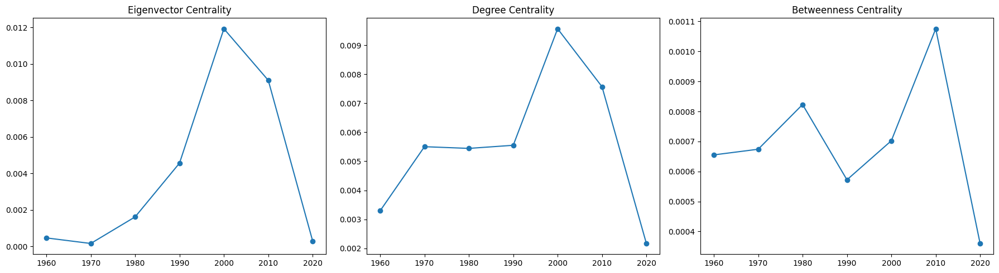

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
# read the centrality data
centrality_df = pd.read_csv('centrality.csv')
# calculate the betweenness centrality,degree centrality and eigenvector centrality
grouped_EC_df = centrality_df.groupby('Decade')['Eigenvector Centrality'].mean().reset_index()
grouped_DC_df = centrality_df.groupby('Decade')['Degree Centrality'].mean().reset_index()
grouped_BC_df = centrality_df.groupby('Decade')['Betweenness Centrality'].mean().reset_index()
dataframes = [grouped_EC_df, grouped_DC_df, grouped_BC_df]
titles = ['Eigenvector Centrality', 'Degree Centrality', 'Betweenness Centrality']
y_columns = ['Eigenvector Centrality', 'Degree Centrality', 'Betweenness Centrality']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Loop through dataframes and plot
for i, (df, title, y_col) in enumerate(zip(dataframes, titles, y_columns)):
    axes[i].plot(df['Decade'], df[y_col], marker='o')
    axes[i].set_title(title)

plt.tight_layout()
plt.show()


#### **Phenomenon 1: Peak in Eigenvector and Degree Centrality in the 2000s**
- **High Eigenvector Centrality**:  
  Indicates that albums from the 2000s had more connections with other influential and central albums in the network. This suggests that the themes of albums during this period were highly aligned with both previous and contemporary popular themes, deeply integrating into the "core" of the network.  

- **High Degree Centrality**:  
  Reflects that albums from this period had the highest number of direct connections, being associated with more albums overall. This likely points to the universal nature of music themes around the 2000s, with a significant degree of overlap or similarity across many albums.

> **Summary**: The 2000s can be seen as the "core years" of the music network, characterized by dense and centralized connections. This indicates a relatively unified or widespread adoption of musical themes during this era, linking albums from various decades.
---

#### **Phenomenon 2: Peak in Betweenness Centrality in the 2010s**
- **High Betweenness Centrality**:  
  Albums from the 2010s played a critical role in connecting different eras and genre clusters within the music network. These albums bridged the popular themes of the 2000s with the increasingly dispersed themes of later periods.

> **Summary**: The 2010s may represent a transitional phase in musical themes, shifting from the concentrated trends of the 2000s to the more diversified and fragmented styles emerging afterward. Albums from this period both extended previous popular themes and explored new styles, making them key connectors between the old and the new.


---
#### **Phenomenon 3: Decline of All Centrality Metrics Post-2010s**
While we cannot draw definitive conclusions here due to incomplete data for the 2020s (as it is still 2024), we can hypothesize:  
- Post-2010s, the genre distribution of albums may become more fragmented, with fewer transitional albums serving as bridges.  
- Music styles might become increasingly niche and diverse, leading to lower overall connectivity in the network.



#### **Conclusion**
From the trends in network centrality metrics, we can infer the following:  
- **Albums from the 2000s were the center of the music network, demonstrating the strongest connectivity and influence.**  
- **Albums from the 2010s served as transitional nodes, linking concentrated older themes with more fragmented newer ones.**  
- **Post-2010s, albums appear to lose connectivity and centrality, indicating a shift toward more diverse and decentralized music themes.**  
----

### **Community Detection: Exploring Modular Changes in Musical Themes within the Network**

Centrality metrics reveal the connectivity characteristics and overall trends of albums from different years: centralization in the 2000s, transitional nature in the 2010s, and decentralization after the 2010s. However, do these trends specifically reflect changes in themes or groups? Are there clear community (genre group) dynamics? To verify this, we employed community detection methods to analyze the modular structure of the music network, further exploring the accuracy of these observations.

In [4]:
import community as community_louvain
import networkx as nx
isolated_nodes = list(nx.isolates(G_undirected))

# remove isolated nodes
G_undirected.remove_nodes_from(isolated_nodes)
louvain_partition = community_louvain.best_partition(G_undirected)

for node in isolated_nodes:
    louvain_partition[node] = -1
    
# calculate the modularity
louvain_modularity = community_louvain.modularity(louvain_partition, G_undirected)
print(f"Louvain score: {louvain_modularity}")

Louvain score: 0.6604271015209282


In the first step of community detection, we used the **Louvain algorithm** to divide the undirected network into communities and calculated the **modularity**, which scored **0.66**. This indicates a significant modular structure within the network. Nodes in the music network tend to cluster within the same community, forming relatively cohesive genre or stylistic groups, while connections between communities are sparser. This modularity provides a solid foundation for further analysis of how musical themes manifest within communities and how these communities evolve over time.

We applied the **Louvain algorithm** to divide the network into multiple communities and used the **ForceAtlas2 layout** to visualize the top 10 largest communities.

/var/folders/rt/lb9jfwsn0d59wvs6_f0ptpjm0000gn/T/ipykernel_51081/1070719773.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20", len(top_communities))  # Use the tab20 color palette
100%|██████████| 2000/2000 [02:23<00:00, 13.90it/s]


BarnesHut Approximation  took  36.33  seconds
Repulsion forces  took  99.30  seconds
Gravitational forces  took  0.48  seconds
Attraction forces  took  1.68  seconds
AdjustSpeedAndApplyForces step  took  2.74  seconds


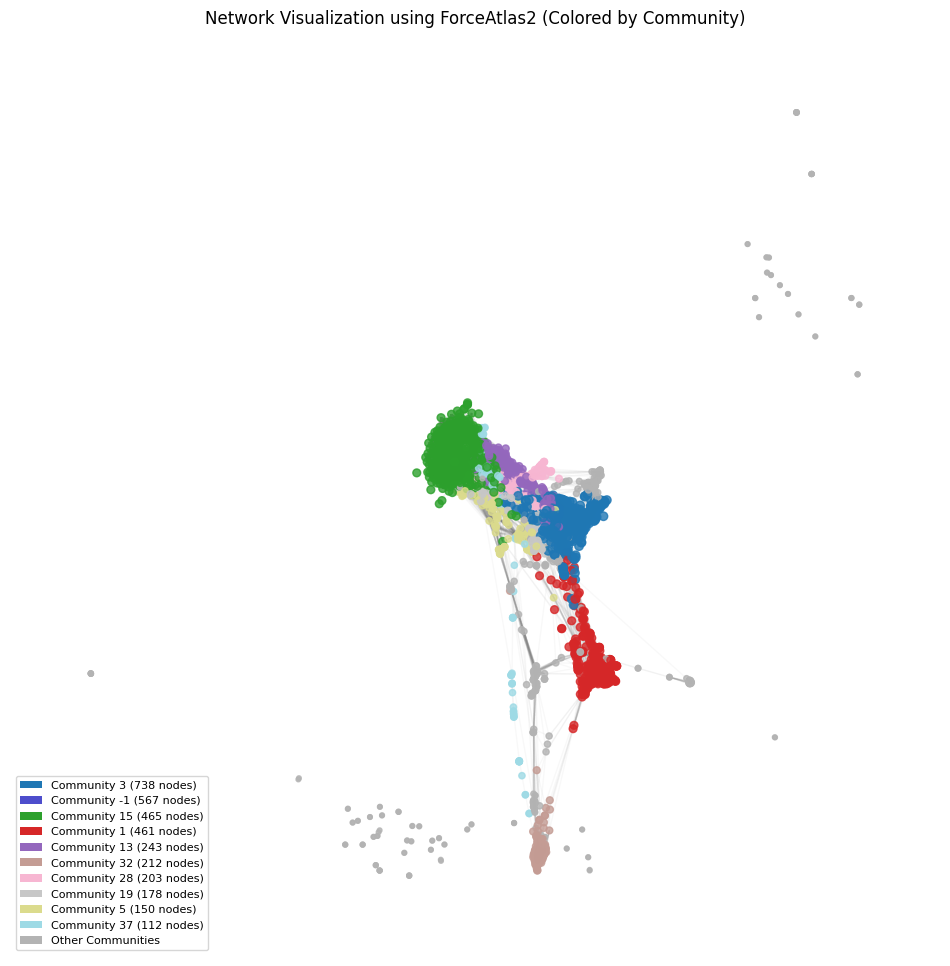

In [5]:
import networkx as nx
import matplotlib.pyplot as plt
from fa2_modified import ForceAtlas2
from matplotlib.patches import Patch
from matplotlib import cm

# Assign different colors to the top 10 largest communities, and use gray for smaller communities
community_sizes = {}
for node, community in louvain_partition.items():
    if community not in community_sizes:
        community_sizes[community] = 0
    community_sizes[community] += 1

# Sort communities by size
sorted_communities = sorted(community_sizes, key=community_sizes.get, reverse=True)
top_communities = sorted_communities[:10]  # Select the top 10 largest communities

# Generate colors using a color map
cmap = cm.get_cmap("tab20", len(top_communities))  # Use the tab20 color palette

color_map = {}
for i, community in enumerate(top_communities):
    color_map[community] = cmap(i)[:3]  # Extract RGB
color_map[-1] = (0.3, 0.3, 0.8)  # Assign a deep blue color for isolated nodes

# Use gray for smaller communities and isolated nodes
for community in sorted_communities[10:]:
    color_map[community] = (0.7, 0.7, 0.7)  # Gray

node_colors = [color_map[louvain_partition[node]] for node in G_undirected.nodes()]

# Adjust node size based on community size (isolated nodes are larger)
node_sizes = [
    50 if louvain_partition[node] == -1 else 10 + community_sizes[louvain_partition[node]] ** 0.5
    for node in G_undirected.nodes()
]

# Step 3: Use the ForceAtlas2 algorithm to compute node layout
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,  # Dissuade hubs
    linLogMode=False,  # Use linear distances
    adjustSizes=False,  # Prevent overlap
    edgeWeightInfluence=1.0,
    jitterTolerance=1.0,
    barnesHutOptimize=True,
    barnesHutTheta=1,
    scalingRatio=75,
    strongGravityMode=False,
    gravity=3,
    verbose=True
)

positions = forceatlas2.forceatlas2_networkx_layout(G_undirected, pos=None, iterations=2000)

# Draw the network graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(
    G_undirected, 
    pos=positions, 
    node_color=node_colors, 
    node_size=[
        80 if louvain_partition[node] == -1 else node_sizes[i]
        for i, node in enumerate(G_undirected.nodes())
    ], 
    alpha=0.8,
)
nx.draw_networkx_edges(
    G_undirected, 
    pos=positions, 
    edge_color="gray", 
    alpha=[
        0.2 if louvain_partition[edge[0]] == -1 or louvain_partition[edge[1]] == -1 else 0.05 
        for edge in G_undirected.edges()
    ]
)

plt.title("Network Visualization using ForceAtlas2 (Colored by Community)")
legend_elements = [
    Patch(facecolor=color_map[community], label=f"Community {community} ({community_sizes[community]} nodes)")
    for community in top_communities
]
legend_elements.append(Patch(facecolor=(0.7, 0.7, 0.7), label="Other Communities"))
plt.legend(handles=legend_elements, loc="lower left", fontsize=8)

plt.axis('off')  # Hide axes
plt.show()


- **Major Communities:** Community 3 (blue), Community 1 (red), and Community 15 (green) are the three largest communities, containing 738, 461, and 465 nodes respectively, forming the core of the network. They represent mainstream musical themes or styles.  
- **Isolated Nodes and Small Communities:** Blue nodes (Community -1) represent isolated nodes, which are weakly connected to the mainstream network, reflecting unique niche musical themes or independent artists.  
- **Inter-community Connectivity:** There are certain connections between different communities, especially among the core communities, indicating some level of genre or stylistic correlation and blending.  
- **Modular Structure:** The boundaries between communities are distinct, with dense connections within communities and sparse connections between them. This aligns with the modularity score (0.659), which highlights the modular characteristics of the network.  
- **Layout Characteristics:** The core communities are more densely distributed, while smaller communities and isolated nodes are dispersed around the periphery, reflecting the dominant influence of core themes on the overall network.

By further analyzing the characteristics of nodes within each community, we can deepen our understanding of the modular structure of the music network and assess the accuracy of observations regarding centralization in the 2000s, transition in the 2010s, and decentralization after the 2010s.


---

#### **Investigation 1: Were albums from the 2000s the center of the music network, demonstrating the strongest connectivity and influence?**


To validate the statement that "albums from the 2000s were the center of the music network, demonstrating the strongest connectivity and influence," we conducted a detailed analysis of the distribution of 2000s albums across different communities. Specifically, we calculated the following metrics:

1. **Proportion of each community in the 2000s:**  
   The proportion of a specific community's albums from the 2000s relative to the total number of albums in the 2000s.  
   $$
   \text{Proportion of a community in the 2000s} = \frac{\text{Number of albums from the 2000s in a community}}{\text{Total number of albums from the 2000s}}
   $$

2. **Overall proportion of each community:**  
   The proportion of a specific community's total number of albums relative to the total number of albums in the entire network.  
   $$
   \text{Overall proportion of a community} = \frac{\text{Total number of albums in a community}}{\text{Total number of albums in the network}}
   $$

3. **Temporal trends in album distribution across communities:**  
   The distribution trend of a specific community's albums over time, measured as the proportion of albums from each decade relative to the community's total albums.  
   $$
   \text{Temporal trend for a community in a decade} = \frac{\text{Number of albums from a decade in a community}}{\text{Total number of albums in that community}}
   $$


In [6]:
import pandas as pd
centrality_df= pd.read_csv('centrality.csv')
louvain_partition_df = pd.DataFrame(
    {"Album": list(louvain_partition.keys()), "Community": list(louvain_partition.values())}
)
centrality_df = centrality_df.merge(louvain_partition_df, on="Album", how="left")



In [7]:
top_10_communities = (centrality_df["Community"]
                      .value_counts()
                      .sort_values(ascending=False)
                      .head(10)
                      .index.tolist())
centrality_df_top10_orgian = centrality_df[centrality_df['Community'].isin(top_10_communities)]
centrality_df_top10= centrality_df_top10_orgian.groupby(['Decade','Community']).size().unstack(fill_value=0)
centrality_df_top10['Total'] = centrality_df_top10.sum(axis=1)
centrality_df_top10.loc['Total'] = centrality_df_top10.sum(axis=0)
centrality_df_top10

Community,-1,1,3,5,13,15,19,28,32,37,Total
Decade,,,,,,,,,,,
1960,68,130,146,38,37,5,1,0,0,2,427
1970,50,166,258,14,36,3,26,0,1,7,561
1980,49,52,224,20,27,41,95,17,32,7,564
1990,106,49,55,16,32,87,20,117,104,28,614
2000,114,34,29,21,63,200,19,61,48,38,627
2010,130,27,22,32,45,122,16,8,27,25,454
2020,50,3,4,9,3,7,1,0,0,5,82
Total,567,461,738,150,243,465,178,203,212,112,3329


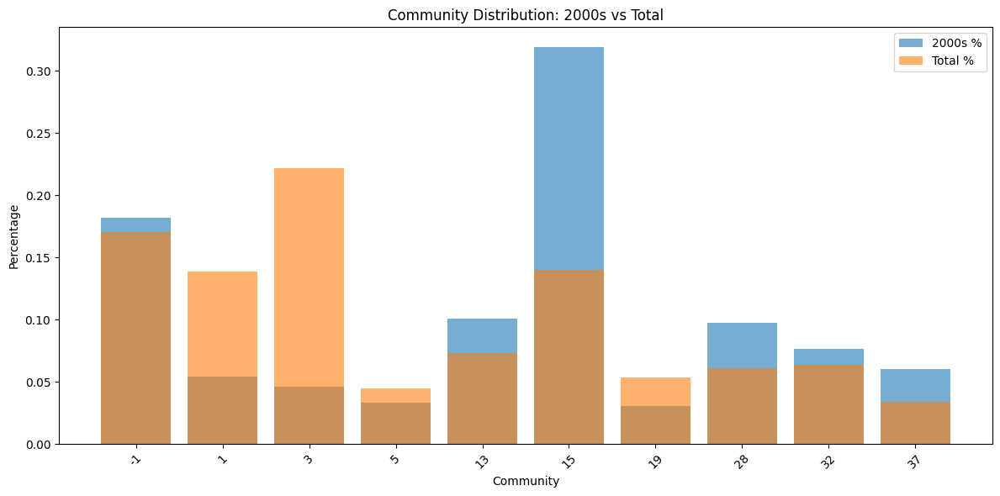

In [8]:
# Perform horizontal analysis using centrality_df_top10 and visualize
# Formula: Community percentage in the 2000s = Number of albums in a community during the 2000s / Total number of albums in the 2000s
# Overall community percentage = Total number of albums in a community / Total number of albums overall

# Calculate the percentage of each community in the 2000s
decade_2000s_total = centrality_df_top10.loc[2000].drop('Total')
total_2000s = decade_2000s_total.sum()

community_2000s_percentage = decade_2000s_total / total_2000s

# Calculate the overall percentage of each community
total_community_distribution = centrality_df_top10.loc['Total'].drop('Total')
overall_total = total_community_distribution.sum()

community_total_percentage = total_community_distribution / overall_total

# Horizontal comparison visualization
plt.figure(figsize=(12, 6))
x_labels = community_2000s_percentage.index.astype(str)
plt.bar(x_labels, community_2000s_percentage, alpha=0.6, label="2000s %")
plt.bar(x_labels, community_total_percentage, alpha=0.6, label="Total %")

plt.title("Community Distribution: 2000s vs Total")
plt.xlabel("Community")
plt.ylabel("Percentage")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The chart above compares the percentage distribution of albums from the 2000s in each community (yellow bars) with their overall percentage distribution (orange bars).

- **Community 15** accounted for **32%** of albums from the 2000s, while its overall proportion was only **14%**, significantly higher than the proportional changes of other communities. This indicates that Community 16 was the most prominent community in the 2000s.  
- **Community -1**, despite having a large number of albums, consists of isolated nodes and is therefore excluded from the centralization analysis, further highlighting the prominence of Community 15.  
- Other communities such as Community 1 and Community 3 did not show similar significant growth in their proportions during the 2000s, underscoring the unique role of Community 15.

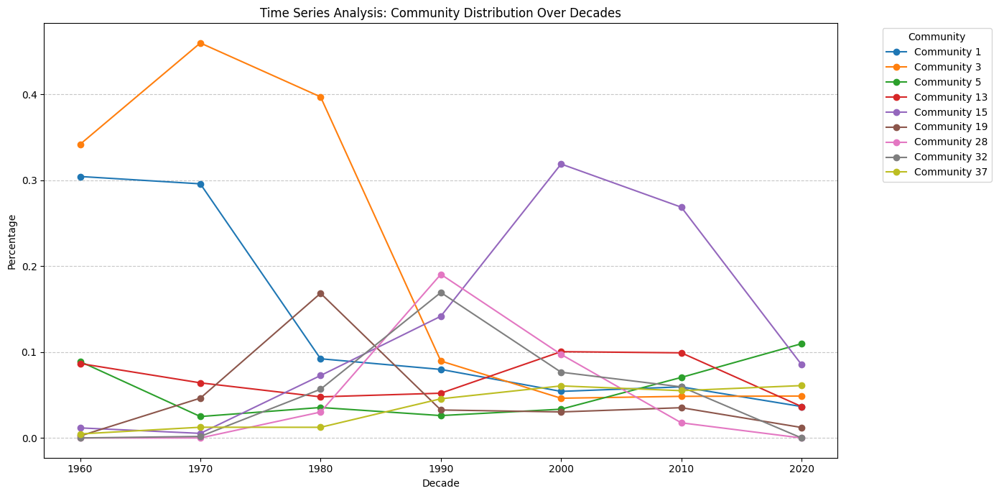

In [9]:
# Time Series Analysis: Analyze the percentage trends of each community over decades

# Remove the column corresponding to Community -1
centrality_df_top10 = centrality_df_top10.drop(columns=-1)

# Calculate the percentage of each community in each decade
percentage_by_decade = centrality_df_top10.div(centrality_df_top10["Total"], axis=0).drop(columns="Total")

# Remove the total row ("Total") and retain actual data
percentage_by_decade = percentage_by_decade.loc[percentage_by_decade.index != 'Total']

# Plot the time series line chart
plt.figure(figsize=(14, 7))

for community in percentage_by_decade.columns:
    plt.plot(
        percentage_by_decade.index,
        percentage_by_decade[community],
        marker='o',
        label=f"Community {community}",
    )

plt.title("Time Series Analysis: Community Distribution Over Decades")
plt.xlabel("Decade")
plt.ylabel("Percentage")
plt.legend(title="Community", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



In the time series chart, Community 15 reached its peak in the 2000s. Observing the period after the 1990s, we find that other communities showed relatively stable changes across decades, without any similar surges.

> **Summary**: Based on the above analysis, it can be concluded that Community 16 not only accounted for **32%** of the total number of albums in the music network during the 2000s but also made up 43% of its own total album count (the second-largest proportion, with the largest being **44%** for Community 32 in the 1990s relative to itself). Additionally, Community 15 exhibited the greatest fluctuations since the 1990s. These findings collectively support the argument that the 2000s served as the central era of the music network, characterized by the strongest connectivity and influence.

#### **Investigation 2: Were albums from the 2010s serve as transitional nodes, linking concentrated older themes with more fragmented newer ones?**


We aim to verify whether the 2010s served as transitional nodes in the music network by connecting multiple communities, continuing older themes while introducing new ones, thus blending the old and the new. To achieve this, we analyze the following two dimensions:

1. **Community Level:** Examine the activity and distribution of multiple communities in the 2010s to explore their role in theme propagation.  

2. **Genre Level:** Compare the distribution and changes of themes across different decades to investigate the characteristics of theme blending in the 2010s.  

##### **Community Level**

At the community level, we calculated the proportion of each community in the 2010s as follows:  
$$
   \text{Proportion of a community in the 2010s} = \frac{\text{Number of albums from a community in the 2010s}}{\text{Total number of albums in the 2010s}}
$$  

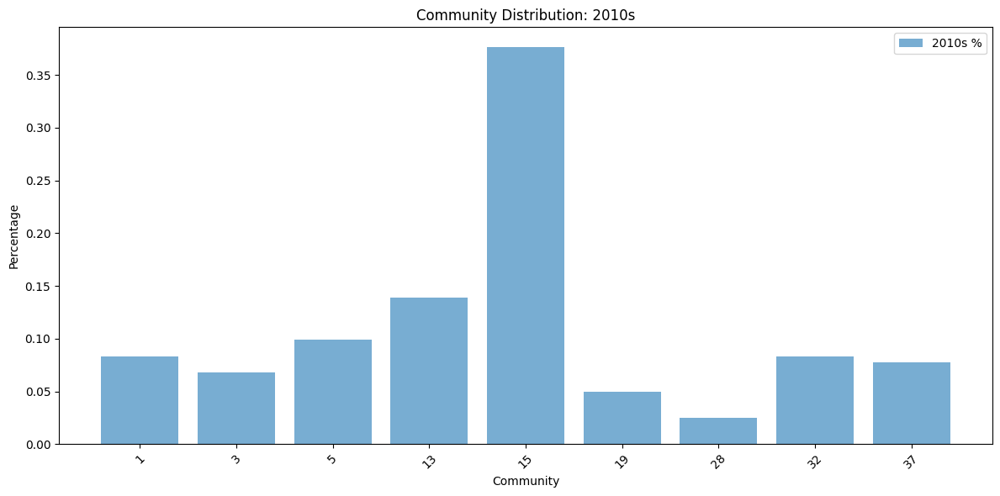

In [10]:
decade_2010s_total = centrality_df_top10.loc[2010].drop('Total')
total_2010s = decade_2010s_total.sum()

community_2010s_percentage = decade_2010s_total / total_2010s

plt.figure(figsize=(12, 6))
x_labels = community_2010s_percentage.index.astype(str)
plt.bar(x_labels, community_2010s_percentage, alpha=0.6, label="2010s %")

plt.title("Community Distribution: 2010s")
plt.xlabel("Community")
plt.ylabel("Percentage")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In the 2010s, we observed that **Community 15** remained the dominant community with the highest proportion, reflecting its continuity during this decade. At the same time, communities such as **13, 15, and 5** also demonstrated relatively high proportions. This indicates that album distribution in the 2010s spanned multiple communities, showcasing genre diversity and integration. Compared to the centralized model of a single dominant community in the 2000s, the 2010s exhibited a more dispersed and balanced distribution, laying the foundation for theme propagation and connection.

> **Summary**: The community-level analysis demonstrates that albums from the 2010s connected multiple communities, forming a transitional node in the network that facilitated genre blending.

##### **Genre Level**

We use word clouds of album themes from the 2000s versus the 2010s to observe whether a transitional period exists.  

/var/folders/rt/lb9jfwsn0d59wvs6_f0ptpjm0000gn/T/ipykernel_51081/3727544809.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  centrality_df_top10_orgian['Genres'] = centrality_df_top10_orgian['Genres'].apply(


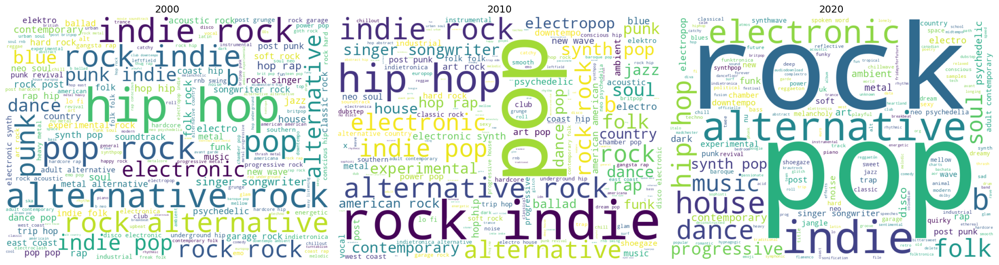

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import ast

centrality_df_top10_orgian['Genres'] = centrality_df_top10_orgian['Genres'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

fig, axes = plt.subplots(1, 3, figsize=(20, 12))  # 1 row, 3 columns
#fig.suptitle("Word Clouds for Genres from 2000s to 2020s", fontsize=20)

for idx, year in enumerate([2000, 2010, 2020]):
    all_genres = []
    for genres in centrality_df_top10_orgian[centrality_df_top10_orgian['Decade'] == year]['Genres']:
        all_genres.extend(genres)
    
    text = ' '.join(all_genres)
    
    # Create word cloud
    wordcloud = WordCloud(width=800, height=600, background_color='white').generate(text)
    
    ax = axes[idx]  # Access the correct subplot axis
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(year, fontsize=14)  # Set title for each decade
    ax.axis("off")  # Hide axes
plt.tight_layout(rect=[0, 0, 1, 0.95]) 
plt.show()

The word cloud comparison shows that the themes of the 2000s were concentrated around **"hip hop," "indie rock,"** and **"alternative rock,"** which dominated the popular music culture of that time. In contrast, the themes of the 2010s became more diverse, with **"pop"** emerging as the dominant theme. At the same time, **"hip hop"** and **"indie rock"** became more prominent compared to the 2000s, while **"alternative rock"** appeared less significant. Additionally, new themes such as **"electropop," "dance pop,"** and **"experimental"** emerged, highlighting the rise of new genres during the 2010s.  

This significant shift reflects how the 2010s balanced the continuation of older themes with the emergence of new ones, marking a transitional period in music.  


#### **Investigation **3:** Do albums post-2010s appear to lose connectivity and centrality, indicating a shift toward more diverse and decentralized music themes?**

To further explore genre changes, we compared word clouds of albums from the 2010s and 2020s.

Compared to the 2010s, the word cloud shows a noticeable decline in the prominence of traditional genres such as **"alternative rock."** At the same time, emerging themes such as **"synth pop," "psychedelic," "house,"** and **"ambient"** have become more prominent, reflecting a high degree of genre diversity.

The boundaries between different themes have become increasingly blurred. For instance, **"electropop"** merges electronic and pop elements, while **"neo soul"** combines soul music with modern influences. This trend signifies a greater degree of genre fusion, with traditional category distinctions starting to dissolve.

---

### **Summary**


Using network centrality metrics, we revealed the connectivity characteristics and overall trends of albums from different years: centralization in the 2000s, a transitional phase in the 2010s, and decentralization after the 2010s. Additionally, we applied community detection methods to analyze the modular structure of the music network, further exploring the accuracy of these observations.  

Our analysis suggests that the 2010s marked a transition in the music industry from unification (dominated by mainstream trends) to decentralization (characterized by niche and individualized styles). This evolution includes the blurring of genre boundaries[1], the fragmentation of traditional genres[2], and the emergence of new micro-genres[3]. This trend may have been driven by external factors such as the rise of streaming platforms[4] and shifts in listener preferences toward the end of the 2010s[5].

------

# **Reference**

[1] Works CitedGoldner, Sam. “The 2010s Were the Decade That Genre Collapsed.” VICE, 5 Nov. 2019, www.vice.com/en/article/2010s-were-the-decade-that-genre-collapsed/. Accessed 4 Dec. 2024.

[2] The Decline of Music Genres. www.560music.com/post/the-decline-of-music-genres.

[3] Works CitedWikipedia Contributors. “Microgenre.” Wikipedia, Wikimedia Foundation, 21 Aug. 2024, en.wikipedia.org/wiki/Microgenre.

[4] Works CitedYellowbrick. “Top 2010s Music Trends: Exploring the Evolution and Influences.” Yellowbrick, 24 Aug. 2023, www.yellowbrick.co/blog/music/top-2010s-music-trends-exploring-the-evolution-and-influences.

[5] Works CitedBello, Pablo, and David Garcia. “Cultural Divergence in Popular Music: The Increasing Diversity of Music Consumption on Spotify across Countries.” Humanities and Social Sciences Communications, vol. 8, no. 1, 27 July 2021, www.nature.com/articles/s41599-021-00855-1, https://doi.org/10.1057/s41599-021-00855-1.

----

## Imports

In [266]:
import musicbrainzngs
import os
import csv
import time
import sys
from albumoftheyearapi import AOTY
import json
import pandas as pd
import lyricsgenius
import re
import networkx as nx
import ast
import matplotlib.pyplot as plt
from collections import Counter
import pickle
import numpy as np
from datetime import datetime
import nltk
import os
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import WordNetLemmatizer
import math
from collections import defaultdict
from nltk.corpus import words
from nltk import FreqDist
from nltk.sentiment import SentimentIntensityAnalyzer
from nrclex import NRCLex

# What makes an album good or bad?

So far we have analyzed some of the best albums of all time, but what makes an album good?

To answer this we create a second network consisting of songs considered "bad" and look at key differences between the two networks to see what sets them apart.

### Network Construction

To create the bad album network, we first inteded to find a list similar to the one we used with the best albums - a top 100 for each year, this time with the worst albums. This presented two problems:

1. The albums on the lists we found consisted of very unconventional music. If we used very spacey unconventional music, this wouldn't be a very interesting analysis, since everyone could tell why the album was considered bad.
2. The lists were short and not divided into years, which would make for a network too small make for a reasonable study

To combat these problems, gathered data for the network by taking each artist in our first network made up of the best albums and taking each artists badly rated album on the website albualbumoftheyear.org (AOTY). The idea was, that on top of getting more album nodes, we could make the assumption that since the albums are made by the same artists, that they consist of "normal" non-expirimental music. Furthermore, this make the analysis more objective: Because deeming albums "good" or "bad is inherently subjective, we remove some of the bias this way, by filtering out die-hard fans rating all albums by a specific artist perfect, artist popularity etc. This way we compared albums on the actual differences in the albums and not the artists, since this is held more constant.

### Data Collection

As mentioned we used AOTY to find the "bad" albums but each artist. For this we used a webscraper found on https://pypi.org/project/album-of-the-year-api/, but this was outdated, so we used the structure of the scraper and rewrote the methods we used ourselves.

because of the limited number of calls we could make to the website server, we only used the top 20 artists from each year in the "good" album network and find their "bad" albums, to save time in data collection. This yields for a smaller network, but should still be sufficient for proper analysis. 

Since all albums an artists has made can be considered "good" we didn't just take the worst album from each artist. Because of this we first calculated the average rating on AOTY of the "good" album network and found it to be 76.62. Then we tried creating the network of "bad" albums with different rating threshholds, balancing sufficient amount of albums and a low rating. we found that a threshhold of a rating of 65 on the AOTY website struck a good balance, since this gave us about 850 albums and amount of albums fell sharply with any rating lower than this. While the difference in rating may not be huge from 76 to 65, this should still be enough to tell us the differences between good and bad albums, only they may be a little less prominent.  

Afterwards, we used the https://genius.com/ API to get the song lyrics from the albums, just like the first network.

finally, the network is created with jaccard similarity of the genres with a threshhold of 0.4 exactly like the "good" album network.

In [51]:
def save_artist_albums(artist, albums_data, file_path=None):
    # Initialize existing_data as an empty dictionary
    existing_data = {}

    # If file_path is provided and the file already exists, load the existing data
    if file_path and os.path.exists(file_path):
        try:
            with open(file_path, 'r') as file:
                existing_data = json.load(file)
        except json.JSONDecodeError:
            # If the file is empty or has invalid JSON, initialize as an empty dictionary
            existing_data = {}

    # Add or update the artist's data
    existing_data[artist] = albums_data

    # Save the updated data to the file
    if file_path:
        try:
            # Open the file in write mode, which will create the file if it doesn't exist
            with open(file_path, 'w') as file:
                json.dump(existing_data, file, indent=4)
            print(f"Data saved to {file_path}")
        except Exception as e:
            print(f"Error saving data to file: {e}")
    else:
        # Just return the updated dictionary if no file path is provided
        return existing_data


In [ ]:
directory_path = 'album'
json_path = 'artist_albums_and_ratings.json'
client = AOTY()

for file_name in os.listdir(directory_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(directory_path, file_name)
        print(f"Processing file: {file_name}")
        
        with open(file_path, mode="r", encoding="utf-8") as file:
            reader = csv.DictReader(file)

            # Limit the processing to the first 50 rows
            for i, row in enumerate(reader):
                if i >= 20:
                    break  # Stop after processing 50 rows
                artist_name = row["Artist Name"]
                print(artist_name)
                time.sleep(6)
                artist_code = client.get_artist_code(artist_name)
                if artist_code:
                    album_and_ratings = client.artist_albums(artist_code)
                    save_artist_albums(artist_name, album_and_ratings, json_path)

In [ ]:
# Directory containing the CSV files
directory_path = 'album'
# Path to the JSON file containing artist albums and ratings
json_path = 'artist_albums_and_ratings.json'

# Load JSON data
if os.path.exists(json_path):
    with open(json_path, "r", encoding="utf-8") as json_file:
        json_data = json.load(json_file)
else:
    json_data = {}

# To hold total scores and counts for average calculation
matched_album_scores = []

# Process each CSV file in the directory
for file_name in os.listdir(directory_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(directory_path, file_name)
        
        with open(file_path, mode="r", encoding="utf-8") as file:
            reader = csv.DictReader(file)

            for row in reader:
                # Check for matches and extract scores
                artist_name = row['Artist Name']
                album_name = row['Album Name']

                # Check if the album exists in the JSON data
                if artist_name in json_data and album_name in [a["album"] for a in json_data[artist_name]]:
                    # Add the scores to the list for averaging
                    for album in json_data[artist_name]:
                        if album['album'] == album_name:
                            if album['critic_score']:
                                matched_album_scores.append(int(album['critic_score']))
                            if album['user_score']:
                                matched_album_scores.append(int(album['user_score']))
                                

# Calculate the average rating of all matched albums
if matched_album_scores:
    average_rating = sum(matched_album_scores) / len(matched_album_scores)
    print(f"Average rating of matched albums: {average_rating:.2f}")
else:
    print("No matched albums found.")


Average rating of matched albums: 76.62


In [ ]:
bad_albums = []
artists = []
for artist in json_data:
    for album in json_data[artist]:

        if album['critic_score']:
            critic_score = int(album['critic_score'])
        #if album['user_score']:
            #user_score = int(album['user_score'])
            
        if (critic_score) < 45:
            bad_albums.append(album)
            artists.append(artist)

print(len(bad_albums))

126


##### Threshold = 65
- 823 albums
- enough nodes, while most likely still a big enough difference in rating to be used for comparison

##### Threshold = 55
- 296 albums
- may be anough nodes, but the difference in rating is probably not worth it for the way smaller number of albums

##### Threshold = 45
- 126 albums
- May not be enough albums and data for a proper comparison after cleaning data for albums without genres

#### Conclusion
a threshold of 65 strikes a good balance between a decent amount of data and drop in rating that should be noticable in the album qualities 

In [ ]:
# Initialize MusicBrainz API with a user agent
musicbrainzngs.set_useragent("AlbumInfoFetcher", "1.0", "your_email@example.com")

# Function to fetch album songs and metadata
def get_album_songs(album_name):
    album_name = album_name['album']
    try:
        # Search for the album using the MusicBrainz API
        result = musicbrainzngs.search_releases(release=album_name, limit=1)
        
        # Check if any results are found
        if not result['release-list']:
            print(f"No results found for album: {album_name}")
            return []

        # Select the first matching album
        release = result['release-list'][0]
        release_id = release['id']

        # Fetch detailed album information using the release ID
        album_data = musicbrainzngs.get_release_by_id(release_id, includes=["recordings", "tags"])
        release_info = album_data['release']
        tracks = release_info['medium-list'][0]['track-list']

        # Extract general album metadata
        album_details = {
            "Album Name": album_name,
            "Status": release_info.get('status', 'Unknown'),
            "Quality": release_info.get('quality', 'Unknown'),
            "Packaging": release_info.get('packaging', 'Unknown'),
            "Language": release_info.get('text-representation', {}).get('language', 'Unknown'),
            "Script": release_info.get('text-representation', {}).get('script', 'Unknown'),
            "Release Date": release_info.get('date', 'Unknown'),
            "Release Country": release_info.get('country', 'Unknown'),
            "Has Artwork": release_info.get('cover-art-archive', {}).get('artwork', 'false'),
            "Front Cover Available": release_info.get('cover-art-archive', {}).get('front', 'false'),
            "Back Cover Available": release_info.get('cover-art-archive', {}).get('back', 'false'),
        }

        # Extract track-level metadata
        songs = []
        for track in tracks:
            recording = track.get('recording', {})
            
            # Extract tags/genres for the recording
            recording_tags = recording.get('tag-list', [])
            recording_genres = ", ".join([tag['name'] for tag in recording_tags]) if recording_tags else "Unknown"

            # Combine album-level and track-level metadata
            song_details = {
                "Track Number": track.get('position', 'Unknown'),
                "Title": recording.get('title', 'Unknown'),
                "Length (ms)": recording.get('length', 'Unknown'),
                "Recording Genres": recording_genres if recording_genres else "Unknown",
                **album_details,
            }
            songs.append(song_details)

        return songs

    except Exception as e:
        # Handle exceptions and print error messages
        print(f"Error fetching album data: {e}")
        return []


In [ ]:
# Check if the CSV file exists to decide whether to write the headers
file_exists = os.path.exists('bad_songs.csv')

for album in bad_albums:
    all_songs = []
    songs_data = get_album_songs(album)  # Replace with your actual function
    if songs_data:
        all_songs.extend(songs_data)
    
    if all_songs:
        df_all_songs = pd.DataFrame(all_songs)
        
        # Write to the CSV file in append mode
        df_all_songs.to_csv('bad_songs.csv', mode="a", index=False, header=not file_exists)
        
        # Update the file_exists flag to ensure headers aren't written again
        file_exists = True



In [ ]:
bad_album_names = []
for album in bad_albums:
    bad_album_names.append(album['album'])

album_to_artist = dict(zip(bad_album_names, artists))

# Create directories for saving lyrics and processed songs
if not os.path.exists("bad_lyrics"):
    os.makedirs("bad_lyrics")

# Function to sanitize filenames by replacing invalid characters
def safe_filename(filename):
    return re.sub(r'[<>:"/\\|?*]', '_', filename)

# Initialize Genius API
genius = lyricsgenius.Genius("FZyxPjY4GKltQjpyKulBfJZwwZWHNySpmbSOtRN1ELpB9MV5b2GSsh6i1dQEgvse")

try:
    # Load song and album data
    df_song = pd.read_csv(f'bad_songs.csv')

    # List to keep track of rows where lyrics are not found
    index_record = []

    # Process each song in the merged data
    for index, row in df_song.iterrows():
        try:
            # Search for lyrics using Genius API
            time.sleep(1)  # Avoid hitting the API rate limit
            song = genius.search_song(row['Title'], album_to_artist[row['Album Name']])
            if song:
                lyrics = song.lyrics
            else:
                lyrics = None

            # If lyrics are not found, log and skip
            if not lyrics:
                print(f"Lyrics not found for {album_to_artist[row['Album Name']]} - {row['Title']}")
                index_record.append(index)
                continue

            # Save lyrics to a text file
            file_path = f'bad_lyrics/{safe_filename(row["Album Name"])}_{safe_filename(album_to_artist[row['Album Name']])}_{safe_filename(row["Title"])}.txt'
            with open(file_path, 'w', encoding='utf-8') as f:
                f.write(lyrics)

        except Exception as e:
            # Handle any errors while downloading lyrics
            print(f"Error downloading lyrics for {album_to_artist[row['Album Name']]} - {row['Title']}: {e}")
            index_record.append(index)

    # Remove rows where lyrics were not found
    df_song = df_song.drop(index=index_record)

    # Save the updated DataFrame
    df_song.to_csv(f'bad_songs_net.csv', index=False)

except Exception as e:
    # Handle any errors while processing the year
    print(f"Error processing: {e}")


In [ ]:
import pandas as pd

# Collect and clean all genres for each album
albums_genres = {}
albums_year = {}

# Load the data
df = pd.read_csv('bad_songs.csv')

# Convert string to list and clean genres
df['Recording Genres'] = df['Recording Genres'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])
df['Recording Genres'] = df['Recording Genres'].apply(lambda x: [genre for genre in x if genre != 'Unknown'])

# Remove rows with empty genres
df = df[df['Recording Genres'].apply(lambda x: bool(x))]

# Extract year from 'release_data' column
df['Year'] = pd.to_datetime(df['Release Date'], errors='coerce').dt.year

# Drop rows with invalid or missing dates
df = df.dropna(subset=['Year'])

# Collect genres and year for each album
for album_name in df['Album Name'].unique():
    album_data = df[df['Album Name'] == album_name]
    
    # Get all genres for the album
    genres = album_data['Recording Genres']
    genres = [genre for sublist in genres for genre in sublist]
    albums_genres[album_name] = set(genres)  # Remove duplicates
    
    # Get the year from the release_data column
    year = album_data['Year'].iloc[0]
    albums_year[album_name] = int(year)

In [ ]:
def jaccard_similarity(set1, set2):
    return len(set1 & set2) / len(set1 | set2)


# based on the statistics information, we choose the threshold as 0.4 and build the network
G = nx.Graph()
for album in albums_genres.keys():  #add nodes
    G.add_node(album)  

# add edges
threshold = 0.4  # threshold
album_list = list(albums_genres.keys())
for i in range(len(album_list)):
    for j in range(i + 1, len(album_list)):
        album1, album2 = album_list[i], album_list[j]
        similarity = jaccard_similarity(albums_genres[album1], albums_genres[album2])
        if similarity > threshold:
            G.add_edge(album1, album2, weight=similarity)

for album in albums_genres.keys():
    G.add_node(album, year=albums_year[album], genres=albums_genres[album])

## Centrality Analysis

We conducted a centrality analysis of the network, including examining its **betweenness centrality**, **eigenvector centrality**, and **degree centrality** just like in the first network

In [ ]:
# save the network to a pickle file the network includes two kinds of attributes ‘year and genres’
with open('G_undirected.pkl', 'wb') as f:
    pickle.dump(G, f)

In [65]:
with open('bad_album_data/G_undirected.pkl', 'rb') as f:
    G_bad = pickle.load(f)

with open('G_undirected.pkl', 'rb') as f:
    G_good = pickle.load(f)

In [ ]:
degree_centrality = nx.degree_centrality(G_bad)
betweenness_centrality = nx.betweenness_centrality(G_bad)
eigenvector_centrality = nx.eigenvector_centrality(G_bad)

bad_year_dict = nx.get_node_attributes(G_bad, 'year')
bad_genres_dict = nx.get_node_attributes(G_bad, 'genres')

# Build DataFrame
centrality_data = {
    "Album": list(degree_centrality.keys()),
    "Degree Centrality": list(degree_centrality.values()),
    "Betweenness Centrality": list(betweenness_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values()),
    "Genres": [
        list(ast.literal_eval(bad_genres_dict[node])) if isinstance(bad_genres_dict[node], str) else list(bad_genres_dict[node])
        for node in degree_centrality.keys()
    ],
    "Year": [bad_year_dict[node] for node in degree_centrality.keys()]
}

centrality_df = pd.DataFrame(centrality_data)

# divide the year into decades
centrality_df['Decade'] = (centrality_df['Year'] // 10) * 10
centrality_df.to_csv('bad_album_data/centrality.csv', index=False)

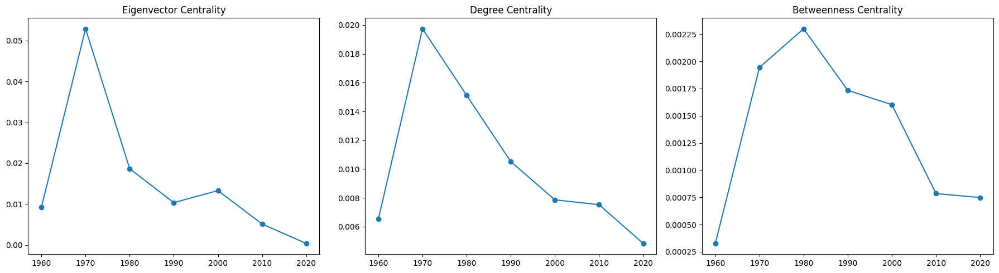

In [61]:
# calculate the betweenness centrality,degree centrality and eigenvector centrality
grouped_EC_df = centrality_df.groupby('Decade')['Eigenvector Centrality'].mean().reset_index()
grouped_DC_df = centrality_df.groupby('Decade')['Degree Centrality'].mean().reset_index()
grouped_BC_df = centrality_df.groupby('Decade')['Betweenness Centrality'].mean().reset_index()
dataframes = [grouped_EC_df, grouped_DC_df, grouped_BC_df]
titles = ['Eigenvector Centrality', 'Degree Centrality', 'Betweenness Centrality']
y_columns = ['Eigenvector Centrality', 'Degree Centrality', 'Betweenness Centrality']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Loop through dataframes and plot
for i, (df, title, y_col) in enumerate(zip(dataframes, titles, y_columns)):
    axes[i].plot(df['Decade'], df[y_col], marker='o')
    axes[i].set_title(title)

plt.tight_layout()
plt.show()

### **Analysis of Centrality Measures in the "Bad" Network**

#### **Phenomenon 1: Peak in Eigenvector and Degree Centrality in the 1970s**
- **High Eigenvector Centrality**:  
  Albums from the 1970s in the "bad" network show high eigenvector centrality, meaning they are closely connected to other influential albums within the network of their time. These albums likely shared common themes or styles that were central to the music of that period, although they may not have reached the critical acclaim or success that albums from the 2000s or 2010s did in the "good" network.

- **High Degree Centrality**:  
  Reflects that albums from the 1970s had numerous direct connections to other albums, suggesting a period of **high experimentation** and genre exploration. These albums were perhaps more widely associated with varied genres but lacked the cohesion seen in the "good" album network in the 2000s, which may explain why these albums spiked in degree centrality without gaining lasting influence.

> **Summary**: The 1970s in the "bad" network can be seen as a time of **experimentation**, where albums were connected to a wide range of styles but did not achieve the same level of critical success or thematic depth as albums from the 2000s in the "good" network.

---

#### **Phenomenon 2: Stability in Betweenness Centrality through the 1980s-1990s**
- **Betweenness Centrality**:  
  The "bad" network shows a less pronounced role for albums from the 1980s and 1990s in connecting various clusters of music themes. While these albums may have been influential in their time, their role as bridges between different genres or eras appears less significant than in the "good" network, where 2010s albums played a crucial bridging role.

> **Summary**: The "bad" network seems to exhibit a **more static and disconnected trend** during the late 20th century, with fewer albums playing a critical role in connecting disparate musical eras or genre clusters.

---

#### **Phenomenon 3: Decline of Centrality Measures Post-2000s**
- **Low Centrality Post-2000s**:  
  Similar to the "good" network, albums from the 2000s onward in the "bad" network show a decline in centrality measures. However, this decline is less sharp than in the "good" network, likely due to the **more fragmented and niche nature** of the albums in the "bad" network, where genre experimentation became more common but failed to resonate with broader audiences.

> **Summary**: Albums post-2000 in the "bad" network reflect a **fragmentation** of musical themes, with fewer albums able to bridge the gaps between eras or maintain centrality within the network.

---

### **Conclusion**
- **Bad albums from the 1970s had the highest centrality, reflecting a time of genre experimentation, but they lacked the lasting influence of albums in the 2000s of the "good" network.**
- **From the 1980s onward, the "bad" network shows a decline in the role of albums as connectors, with music becoming increasingly fragmented, similar to trends observed in the "good" network.**
- We will **further analyze** these trends by examining the **average number of unique genres per album per decade** to explore whether the diversity of genres correlates with centrality in both networks.


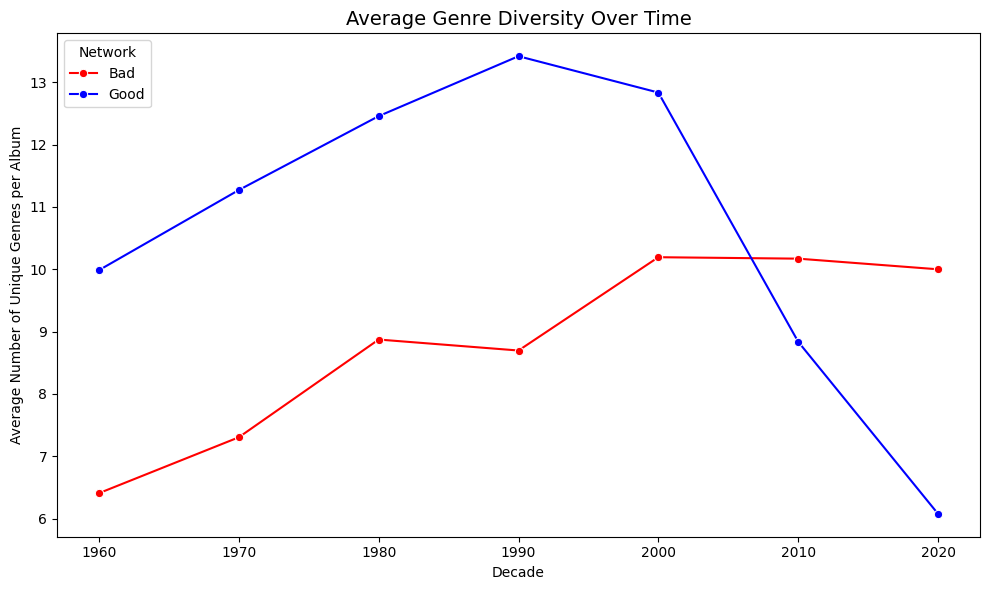

In [72]:
bad_year_dict = nx.get_node_attributes(G_bad, 'year')
bad_genres_dict = nx.get_node_attributes(G_bad, 'genres')
good_year_dict = nx.get_node_attributes(G_good, 'year')
good_genres_dict = nx.get_node_attributes(G_good, 'genres')

# Function to calculate genre diversity
def calculate_genre_diversity(year_dict, genres_dict, label):
    genre_data = {
        "Album": list(genres_dict.keys()),
        "Genres": [
            list(ast.literal_eval(genres_dict[node])) if isinstance(genres_dict[node], str) else list(genres_dict[node])
            for node in genres_dict.keys()
        ],
        "Year": [year_dict[node] for node in genres_dict.keys()],
        "Network": label
    }
    genre_df = pd.DataFrame(genre_data)
    genre_df['Decade'] = (genre_df['Year'] // 10) * 10
    # Calculate number of unique genres per album
    genre_df['Genre Diversity'] = genre_df['Genres'].apply(len)
    return genre_df

# Process data for both "good" and "bad" networks
good_genre_diversity = calculate_genre_diversity(good_year_dict, good_genres_dict, 'Good')
bad_genre_diversity = calculate_genre_diversity(bad_year_dict, bad_genres_dict, 'Bad')

# Combine data for both networks
combined_genre_diversity = pd.concat([good_genre_diversity, bad_genre_diversity])

# Calculate average genre diversity by decade and network
average_genre_diversity = (
    combined_genre_diversity
    .groupby(['Decade', 'Network'])['Genre Diversity']
    .mean()
    .reset_index()
    .rename(columns={'Genre Diversity': 'Average Genre Diversity'})
)

# Visualization
plt.figure(figsize=(10, 6))
sns.lineplot(
    data=average_genre_diversity,
    x='Decade',
    y='Average Genre Diversity',
    hue='Network',
    marker='o',
    palette={'Good': 'blue', 'Bad': 'red'}
)
plt.title('Average Genre Diversity Over Time', fontsize=14)
plt.ylabel('Average Number of Unique Genres per Album')
plt.xlabel('Decade')
plt.legend(title='Network', loc='upper left')
plt.tight_layout()
plt.show()


### **Analysis of Genre Diversity by Decade: Comparison of the "Good" and "Bad" Networks**

The following chart visualizes the **average number of unique genres per album** for both the "good" and "bad" networks across different decades. Based on our previous discussion, we observe notable differences between the networks.

#### **Chart Interpretation:**
- **Good Network**:  
  The "good" network shows a **higher average number of unique genres per album** until the 2010s, with a peak in the 1990s. This indicates that albums from the 1980s and 1990s in the "good" network were highly experimental, incorporating a wider variety of genres. The **peak in the 1990s** likely reflects the diversity and genre-blending that characterized the decade, especially with the emergence of alternative, grunge, and electronic music. This aligns with the centrality measures, where albums from the 2000s and 2010s had **higher eigenvector and degree centrality**, indicating that they were well-connected within the network. The **decline in genre diversity after 2010** in the "good" network could be linked to the trend towards **more specialized, mainstream sounds** that prioritize cohesion and cross-genre collaboration, which might reduce the diversity of genres per album but increase network centrality.

- **Bad Network**:  
  The "bad" network shows a **lower average number of unique genres per album** in the earlier decades, with a **steady increase** throughout the 2000s and beyond. This suggests that albums in the "bad" network were initially more focused on single genres, but genre-blending became more common in the later decades. This increasing genre diversity in the "bad" network could indicate a trend of **increased experimentation** or a wider range of genres emerging, albeit with lower quality or critical acclaim. The **spike in centrality in the 1970s** for the "bad" network reflects the **high number of genre connections** made in that period, but these albums did not achieve the same lasting influence or success as albums from the "good" network.

#### **Possible Reasons for the Differences:**
- **Genre Evolution in "Good" Network**: The peak in genre diversity during the 1990s and the subsequent decline after 2010 in the "good" network may be due to the trend towards **more cohesive, mainstream sounds**. Albums became more **genre-focused** to align with evolving tastes in the industry, focusing on mastering a single genre or subgenre to achieve critical acclaim. This aligns with the **higher centrality in the 2000s and 2010s**, where albums that fit well within the core genre networks were more influential.
  
- **Genre Evolution in "Bad" Network**: The gradual increase in genre diversity in the "bad" network suggests that over time, albums in this network began experimenting more with genre combinations, even though these albums did not achieve the same level of centrality or influence as the "good" network albums. The rise in genre diversity might be attributed to the increasing **accessibility of music production tools** and platforms, leading to **more niche experimentation** with genres, although often without the level of **cohesion or refinement** that is typically expected in critically acclaimed albums.

#### **Conclusion:**
- **Good Network**: The higher genre diversity in the 1980s-1990s and the subsequent decline after 2010 suggests a shift toward more **specialized, mainstream genres** that led to **higher centrality** but reduced diversity. Albums became more focused on specific sounds that were widely embraced and connected to a core set of popular themes.
  
- **Bad Network**: The "bad" network's gradual increase in genre diversity, especially after the 2000s, indicates a shift toward **experimentalism** and **niche genre combinations**, though this did not lead to the same level of critical success. The albums in this network often lacked the **cohesion and polish** seen in the "good" albums, which explains why they did not achieve high centrality measures despite their increased genre diversity.


In [80]:
import pandas as pd

# Function to convert top genres to a structured DataFrame
def format_top_genres(network_name, top_genres):
    rows = []
    for decade, genres in sorted(top_genres.items()):
        row = {'Network': network_name, 'Decade': decade}
        for i, (genre, _) in enumerate(genres, start=1):
            row[f'Top {i} Genre'] = genre
        rows.append(row)
    return pd.DataFrame(rows)

# Create DataFrames for each network
good_genres_df = format_top_genres("Good", good_top_genres)
bad_genres_df = format_top_genres("Bad", bad_top_genres)

# Combine the DataFrames for comparison
comparison_df = pd.concat([good_genres_df, bad_genres_df], ignore_index=True)

# Display the DataFrame
display(comparison_df)


,Network,Decade,Top 1 Genre,Top 2 Genre,Top 3 Genre,Top 4 Genre,Top 5 Genre
0,Good,1960,rock,pop,classic rock,rock and roll,soul
1,Good,1970,rock,pop,classic rock,soul,pop rock
2,Good,1980,rock,pop,pop rock,pop/rock,classic rock
3,Good,1990,rock,alternative rock,pop,pop/rock,hip hop
4,Good,2000,rock,alternative rock,indie,indie rock,pop
5,Good,2010,rock,pop,indie,indie rock,alternative rock
6,Good,2020,pop,electronic,rock,alternative rock,indie pop
7,Bad,1960,soul,r&b,pop,rock,oldies
8,Bad,1970,rock,pop,classic rock,soul,r&b
9,Bad,1980,rock,pop,classic rock,pop/rock,pop rock


#### **Comparison of Top Genres in Good and Bad Networks**
The table above lists the top 5 genres for each decade in the "Good" and "Bad" album networks. This highlights the most influential genres in each network across decades, allowing for a comparison of genre trends and diversity.

1. **Dominance of Rock**:
   - Both networks consistently feature "rock" as the top genre across decades, indicating its widespread influence in both "good" and "bad" albums.
   
2. **Genre Diversity**:
   - The "Good" network shows more diversity, with genres like "indie," "alternative rock," and "electronic" becoming prominent from the 1990s onward.
   - The "Bad" network remains focused on "rock," "pop," and "classic rock" across most decades, with limited variation.

3. **Shift in 2020s**:
   - Both networks highlight "pop" as the leading genre in the 2020s, reflecting a convergence toward contemporary mainstream trends.

4. **Unique Patterns**:
   - The "Good" network incorporates newer and more niche genres (e.g., "indie pop," "alternative rock"), suggesting a stronger alignment with evolving musical trends.
   - The "Bad" network relies more heavily on traditional genres like "classic rock" and "pop/rock," indicating less experimentation or innovation.


## **Analyzing Album Structure and Themes**

To further explore the differences between "good" and "bad" albums, we will analyze the structure of each album and the themes of the songs they contain. This will include examining aspects such as:

- **Number of Songs**: Comparing the average number of songs per album in each network.
- **Song Lengths**: Investigating whether the length of songs differs significantly between the two networks.
- **Themes and Lyrics**: Using text analysis techniques to identify dominant themes and topics in the lyrics.

Additionally, to account for the evolution of music over time, we will divide the analysis by decade. This will allow us to isolate network-specific differences without mistaking them with broader developments in the music industry and genre trends.  


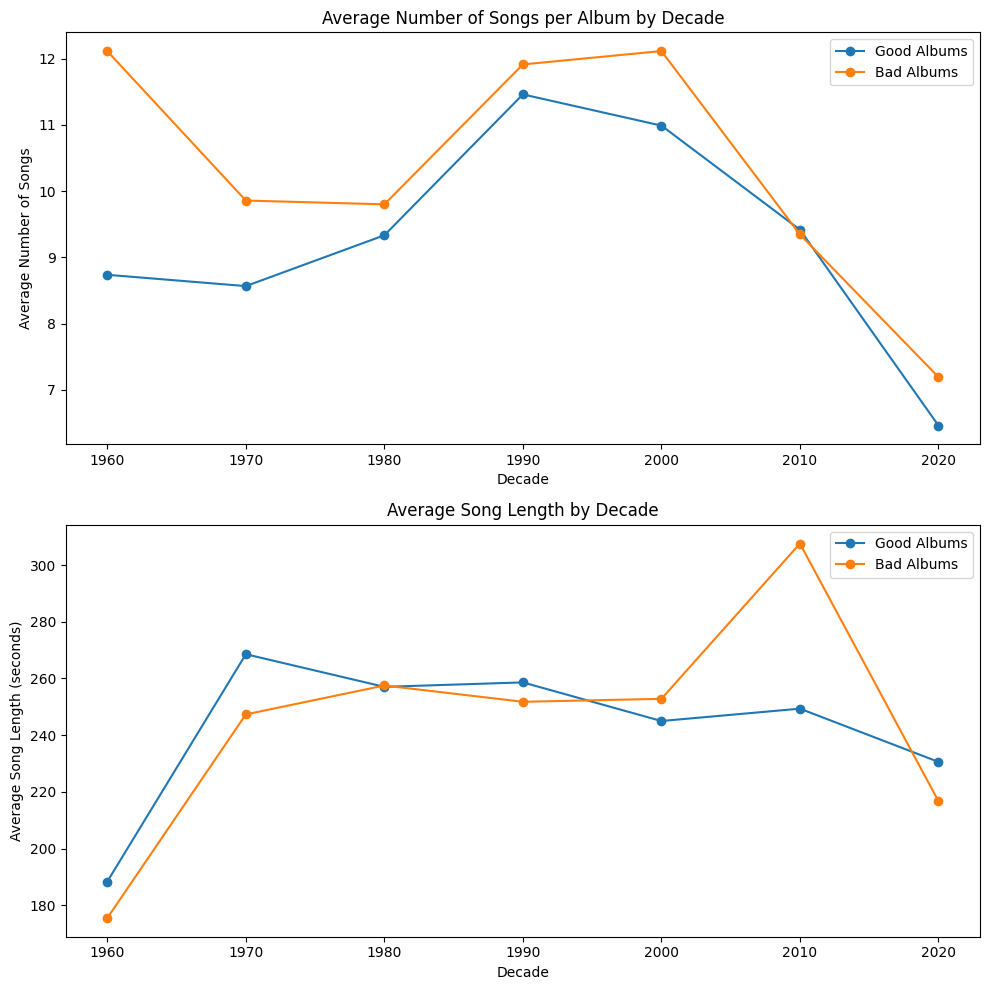

In [ ]:
# For the good network
good_albums = []

for year in range(1960, 2024):
    file_path = f'songs_lyrics/top100_albums_{year}_songs.csv'
    df = pd.read_csv(file_path)
    df['Recording Genres'] = df['Recording Genres'].apply(lambda x: x.split(', '))  # Convert string to list
    df = df[df['Recording Genres'].apply(lambda x: 'Unknown' not in x and x != [])]  # Remove empty or "Unknown"
    df['Decade'] = (df['Year'] // 10) * 10  # Decade from Year
    good_albums.append(df)

# Combine all good network data
good_songs = pd.concat(good_albums)

# Ensure that the 'Length (ms)' column is numeric, and handle any errors in conversion
good_songs['Length (ms)'] = pd.to_numeric(good_songs['Length (ms)'], errors='coerce') / 1000

good_albums_data = (
    good_songs.groupby(['Decade', 'Album Name'])
    .agg(NumSongs=('Title', 'count'), AvgSongLength=('Length (ms)', 'mean'))
    .reset_index()
)

# For the bad network
bad_songs = pd.read_csv('bad_album_data/bad_songs.csv')

# Ensure that the 'Length (ms)' column is numeric, and handle any errors in conversion
bad_songs['Length (ms)'] = pd.to_numeric(bad_songs['Length (ms)'], errors='coerce') / 1000

bad_songs['Year'] = pd.to_datetime(bad_songs['Release Date'], errors='coerce').dt.year

# Corrected Date Parsing for 'Release Date'
bad_songs['Decade'] = (bad_songs['Year'] // 10) * 10

# Aggregating album data
bad_albums_data = (
    bad_songs.groupby(['Decade', 'Album Name'])
    .agg(NumSongs=('Title', 'count'), AvgSongLength=('Length (ms)', 'mean'))
    .reset_index()
)

# Compute averages by decade for both networks
good_decade_avg = good_albums_data.groupby('Decade').agg(
    AvgNumSongs=('NumSongs', 'mean'), AvgSongLength=('AvgSongLength', 'mean')
).reset_index()

bad_decade_avg = bad_albums_data.groupby('Decade').agg(
    AvgNumSongs=('NumSongs', 'mean'), AvgSongLength=('AvgSongLength', 'mean')
).reset_index()




fig, axes = plt.subplots(2, 1, figsize=(10, 10))

# Number of Songs per Album
axes[0].plot(good_decade_avg['Decade'], good_decade_avg['AvgNumSongs'], label='Good Albums', marker='o')
axes[0].plot(bad_decade_avg['Decade'], bad_decade_avg['AvgNumSongs'], label='Bad Albums', marker='o')
axes[0].set_title('Average Number of Songs per Album by Decade')
axes[0].set_xlabel('Decade')
axes[0].set_ylabel('Average Number of Songs')
axes[0].legend()

# Average Song Length
axes[1].plot(good_decade_avg['Decade'], good_decade_avg['AvgSongLength'], label='Good Albums', marker='o')
axes[1].plot(bad_decade_avg['Decade'], bad_decade_avg['AvgSongLength'], label='Bad Albums', marker='o')
axes[1].set_title('Average Song Length by Decade')
axes[1].set_xlabel('Decade')
axes[1].set_ylabel('Average Song Length (seconds)')
axes[1].legend()

plt.tight_layout()
plt.show()


### Analysis of Song Length and Number of Songs by Decade for the Good and Bad Networks

In this analysis, we computed the average number of songs and the average song length for albums in both the Good and Bad networks across different decades.

#### Steps Taken:
1. **Data Aggregation**:
   - We grouped the data by `Decade` and `Album Name` to calculate:
     - The number of songs per album.
     - The average song length (in milliseconds) per album.
2. **Plotting**:
   - We visualized the trends in the **average number of songs per album** and **average song length per album** across decades for both networks.

#### Results:

- **Average Number of Songs**:
  - The Bad network shows a slightly higher number of songs, particularly in the 1970s and 1980s.
  - It is interesting to note that the overall trend of number of songs per album seems to be going down for all albums
  
- **Average Song Length**:
  - The Bad network exhibits a slightly higher average song length in the 2010s, but again, the differences seem random across decades.


**The differences in the number of songs per album and song length by decade between the Good and Bad networks do not appear to show a clear or consistent pattern. Although there are some small variations, such as the Bad network having slightly more songs in the 1970s and 1980s, and higher song lengths in the 2010s, these differences do not seem to distinctly separate the Good and Bad albums. This suggests that factors like the number of songs and average song length may not be sufficient to distinguish between good and bad albums, or at least do not show a consistent trend when analyzed across decades.***


# Analysis of Lyrics with TF-IDF and Word Clouds

In this analysis, we preprocess song lyrics from both the **good network** and **bad network** based on the decade of release and use **TF-IDF (Term Frequency-Inverse Document Frequency)** to identify important words across decades. We then generate word clouds to visually capture the most prominent words based on their TF-IDF scores for each network and decade.

### Preprocessing Steps:
1. **Remove Irrelevant Content**: 
    - The first line of each song's lyrics is removed, as it typically does not contain relevant lyrical content.
    - Any content enclosed within square brackets (e.g., [Chorus], [Verse 1], etc.) is removed to avoid noise in the lyrics data.
   
2. **Tokenization and Lemmatization**:
    - The lyrics are tokenized into individual words (tokens), converted to lowercase, and non-alphabetic characters are filtered out.
    - We use **lemmatization** (with the `WordNetLemmatizer`) to reduce words to their root form, ensuring that variations of a word are treated as the same term.

3. **Stopword Removal**:
    - Common English stopwords are removed, as these do not provide meaningful insights into the unique language of the songs.

4. Token Aggregation by Decade:
    - After preprocessing, we aggregated the tokens by decade of release. This step ensures that we examine the word patterns of each network within specific time frames, since this will change over time.

5. TF-IDF Calculation:
    - we calculate the **TF-IDF score**, which allows us to highlight words that are both frequent in individual decades and rare across all decades, to see how the lyrics change over time.
    - The **logarithmic IDF** helps scale down the influence of commonly occurring words and allows us to focus on less frequent, but potentially more meaningful, words.

6. Word clouds:
    - we also create word clouds from the term frequency for each decade for both networks to see if the themes in the songs matches the topics of the decade they were made in.
  
**Doing this and looking at the TF-IDF score and wordclouds, we want to examining the words that are most important in each decade for both networks, and identify themes the songs touch upon, over the years and see how this changes. We can also compare the this for both networks, to see if good and bad albums focus on different things and if these subject are relevant to for the time they are made in or not.**


In [189]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('words')

def preprocess_lyrics(lyrics_text):
    # Remove the first line
    lyrics_lines = lyrics_text.split('\n')
    lyrics_text = '\n'.join(lyrics_lines[1:])  # Remove the first line
    
    # Remove everything inside square brackets (e.g., [Chorus], [Verse 1], etc.)
    lyrics_text = re.sub(r'\[.*?\]', '', lyrics_text)
    
    # Convert to lowercase
    lyrics_text = lyrics_text.lower()
    
    # Tokenize the lyrics
    tokens = word_tokenize(lyrics_text)
    
    # Remove punctuation and non-alphabetical tokens
    tokens = [word for word in tokens if word.isalpha()]
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Initialize lemmatizer
    lemmatizer = WordNetLemmatizer()
    
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

     # Filter tokens to only include words in the English dictionary
    valid_words = set(words.words())
    tokens = [word for word in tokens if word in valid_words]
    
    # Return the preprocessed tokens as a string (or a list of tokens if preferred)
    return tokens


[nltk_data] Downloading package punkt to /Users/daniel/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/daniel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/daniel/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to /Users/daniel/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [226]:
import os

# --- Process Good Network Data ---
good_decade_tokens = {decade: [] for decade in range(1960, 2024, 10)}

# Process good albums and divide them by decade
for _, song_row in good_songs.iterrows():
    album_name = song_row['Album Name']
    song_title = song_row['Title']
    decade = song_row['Decade']
    track_number = song_row['Track Number']  # Assuming track number is in the data
    
    # Search for files in the 'lyrics' folder that match the pattern 'album_name_song_title.txt'
    matching_files = [file for file in os.listdir('lyrics') if album_name.lower() in file.lower() and song_title.lower() in file.lower()]
    
    if matching_files:
        # Take the first matching file
        lyrics_file_path = os.path.join('lyrics', matching_files[0])
        
        # Read the lyrics from the file
        with open(lyrics_file_path, 'r', encoding='utf-8') as file:
            lyrics_text = file.read()

        # Preprocess the lyrics (Assumed you have a function `preprocess_lyrics`)
        tokens = preprocess_lyrics(lyrics_text)
        
        # Append tokens along with album, song, and track number info to the appropriate decade
        if decade and decade in good_decade_tokens:
            good_decade_tokens[decade].append({
                'Album': album_name,
                'Song': song_title,
                'Track Number': track_number,
                'Tokens': tokens
            })

# --- Process Bad Network Data ---
bad_decade_tokens = {decade: [] for decade in range(1960, 2024, 10)}

# Process bad albums and divide them by decade
for _, song_row in bad_songs.iterrows():
    album_name = song_row['Album Name']
    song_title = song_row['Title']
    decade = song_row['Decade']
    track_number = song_row['Track Number']  # Assuming track number is in the data
    
    # Search for files in the 'lyrics' folder that match the pattern 'album_name_song_title.txt'
    matching_files = [file for file in os.listdir('bad_album_data/bad_lyrics') if album_name.lower() in file.lower() and song_title.lower() in file.lower()]
    
    if matching_files:
        # Take the first matching file
        lyrics_file_path = os.path.join('bad_album_data/bad_lyrics', matching_files[0])
        
        # Read the lyrics from the file
        with open(lyrics_file_path, 'r', encoding='utf-8') as file:
            lyrics_text = file.read()

        # Preprocess the lyrics (Assumed you have a function `preprocess_lyrics`)
        tokens = preprocess_lyrics(lyrics_text)
        
        # Append tokens along with album, song, and track number info to the appropriate decade
        if decade and decade in bad_decade_tokens:
            bad_decade_tokens[decade].append({
                'Album': album_name,
                'Song': song_title,
                'Track Number': track_number,
                'Tokens': tokens
            })


## Observations on Frequency Distributions

After some preprocessing like lemmatizing and removal of stopwords, we compute the most frequent words in both good and bad networks and it is shown below that bot good and bad albums are highly similar across decades, with words like "like," "love," "know," "one," and "time" dominating both lists. This suggests:

- **Similarity in Vocabulary**: Common, general-purpose words are prevalent in both networks, reflecting a lack of clear lexical differences.
- **Artist Overlap**: Shared artists between the networks likely contribute to these similarities, as lyrical styles tend to remain consistent.
- **Decade Trends**: Shifts in word usage, such as increased "like" and "know" in later decades, reflect broader changes in lyrical styles over time.

These findings indicate that differences in lexical usage might vary more by artist or genre than by good vs. bad albums.


In [227]:
# Function to calculate and display frequency distributions
def display_frequency_distributions(decade_tokens, network_name):
    for decade, entries in decade_tokens.items():
        # Extract tokens from all entries for the decade
        all_tokens = [token for entry in entries for token in entry['Tokens']]
        
        # Create a frequency distribution
        freq_dist = FreqDist(all_tokens)
        
        # Display the decade and top 10 words with frequencies
        print(f"\nFrequency Distribution for {network_name} Network - {decade}s:")
        for word, frequency in freq_dist.most_common(10):  # Show top 10 words
            print(f"{word}: {frequency}")

# Display frequency distributions for the good network
display_frequency_distributions(good_decade_tokens, "Good")

# Display frequency distributions for the bad network
display_frequency_distributions(bad_decade_tokens, "Bad")


Frequency Distribution for Good Network - 1960s:
vincent: 432
got: 358
like: 341
know: 338
man: 336
butch: 329
love: 288
na: 272
one: 270
go: 265

Frequency Distribution for Good Network - 1970s:
yeah: 472
na: 434
slave: 402
root: 339
gon: 326
like: 321
kick: 314
baby: 273
know: 256
love: 246

Frequency Distribution for Good Network - 1980s:
like: 1581
love: 1411
know: 1375
one: 1275
got: 1154
time: 1100
na: 1086
jordan: 1047
get: 954
oh: 949

Frequency Distribution for Good Network - 1990s:
like: 10741
one: 9240
know: 6740
time: 5603
love: 5528
got: 5302
would: 5206
get: 4870
see: 4819
might: 4298

Frequency Distribution for Good Network - 2000s:
like: 24406
one: 18421
know: 16812
get: 14349
got: 13585
go: 13059
time: 12398
see: 11977
love: 11690
man: 11357

Frequency Distribution for Good Network - 2010s:
like: 32371
one: 24578
say: 24555
know: 24096
go: 20406
get: 18134
love: 17070
see: 16157
time: 15834
come: 14974

Frequency Distribution for Good Network - 2020s:
like: 5815
know:

In [194]:
def caluclate_tf_idf(decade_tokens_dict):
    relative_tf_dict = defaultdict(lambda: defaultdict(float))

    for decade, entries in decade_tokens_dict.items():
        # Extract tokens from all entries for the decade
        tokens = [token for entry in entries for token in entry['Tokens']]
        
        # Calculate term frequency for each word in the decade
        total_count = len(tokens)
        freq_dist = nltk.FreqDist(tokens)
        
        for word, freq in freq_dist.items():
            relative_tf_dict[decade][word] = freq / total_count

    # Calculate document frequency (how many decades the word appears in)
    doc_freq = defaultdict(int)
    N = len(decade_tokens_dict)  # Total number of decades (documents)

    # Iterate through the relative TF dictionary to calculate document frequency
    for decade in relative_tf_dict:
        unique_words = relative_tf_dict[decade].keys()  # Get unique words for each decade
        for word in unique_words:
            doc_freq[word] += 1  # Increment count for each word's document frequency

    # Calculate IDF for each word
    idf_dict = {}
    for word, freq in doc_freq.items():
        idf_dict[word] = math.log(N / freq)  # Logarithmic IDF

    # Calculate TF-IDF for Each Word in Each Decade ---
    tf_idf_dict = defaultdict(dict)

    for decade in relative_tf_dict:
        for word in relative_tf_dict[decade]:
            tf = relative_tf_dict[decade][word]
            idf = idf_dict.get(word, 0)  # Use 0 for words that don't appear in the IDF dictionary
            tf_idf_dict[decade][word] = tf * idf  # TF-IDF score
    
    return tf_idf_dict


## Word Clouds Using TF-IDF

We created word clouds for both good and bad albums by calculating the Term Frequency-Inverse Document Frequency (TF-IDF) for each decade. This method helps us find words that are unique and important to each decade’s lyrics, showing us what topics stand out for that time period.

## Observations from the Word Clouds

### Main Themes in Good Albums
The **good albums** focus on important social, political, and personal issues from their time. For example, in the **1970s**, words like "Slave," "Prostitute," and "Slaveholder" show that the lyrics were about civil rights and racial inequality, big issues of that era. In the **1980s**, words like "officer," "warrant," and "court" suggest that the songs were about law, justice, and political activism, which were important topics at that time.

In the **2000s**, words like "perspectivity" and "cognition" show a shift to more personal or intellectual topics, reflecting the rise of technology and personal development in the early 21st century.

### Main Themes in Bad Albums
The **bad albums** focus more on personal stories or smaller topics, with less attention to big social or political issues. In the **1970s**, words like "skylark" and "vitriol" suggest more emotional and abstract themes, rather than dealing with political struggles. In the **1980s**, words like "norma" and "employee" hint at personal or work-related concerns, which reflect the growing corporate culture of the time.

In the **2010s**, words like "labour" and "capitalist" show that the lyrics were about economic issues, but they feel more distant and less connected to the larger problems of society compared to the good albums.

### Relevance to the Decade
- **Good albums** are more connected to the big issues of their time. For example, the **1970s** good albums focus on civil rights, while the **1990s** albums address government and social issues in a critical way.
- **Bad albums** focus more on personal experiences and less on the larger issues of the time.

### Subsection and Subparagraph
In the **2020s** word cloud, we see terms like "subsection" and "subparagraph," which are not part of the song lyrics. These terms likely came from the **Genius files**, which contain extra information about the songs, like formatting, not the actual lyrics.

Overall, **good albums** do a better job of addressing the important topics of the time, using language that connects to social and political issues. On the other hand, **bad albums** focus more on personal stories and less on big issues.


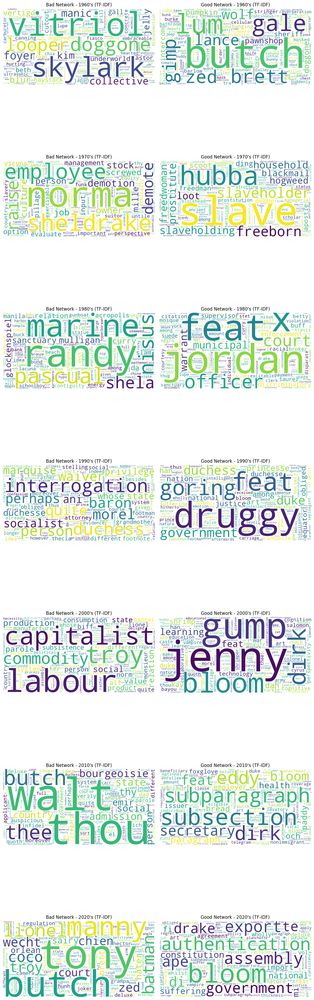

In [228]:
# --- Calculate TF-IDF ---
bad_tf_idf_dict = caluclate_tf_idf(bad_decade_tokens)
good_tf_idf_dict = caluclate_tf_idf(good_decade_tokens)

# --- Plot Word Clouds ---
# Number of columns for the grid layout (we have two datasets: 'bad' and 'good')
num_columns = 2  # One column for bad network and one for good network
# Calculate the number of rows needed based on the number of decades in the dictionaries
num_rows = max(len(bad_tf_idf_dict), len(good_tf_idf_dict))

# Create a matplotlib figure with the appropriate size
plt.figure(figsize=(num_columns * 6, num_rows * 6))

# Loop through each decade and its corresponding TF-IDF scores for both bad and good networks
for i, decade in enumerate(sorted(bad_tf_idf_dict.keys())):
    # Calculate the row and column positions for bad and good networks
    row = i
    col_bad = 0  # Column 0 for bad network
    col_good = 1  # Column 1 for good network

    # Get the corresponding TF-IDF scores for the bad and good networks
    bad_tf_idf_score = bad_tf_idf_dict.get(decade, {})
    good_tf_idf_score = good_tf_idf_dict.get(decade, {})

    # Plot the word cloud for the bad network in the left column
    plt.subplot(num_rows, num_columns, row * num_columns + col_bad + 1)
    wordcloud_bad = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(bad_tf_idf_score)
    plt.imshow(wordcloud_bad, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Bad Network - {decade}'s (TF-IDF)")

    # Plot the word cloud for the good network in the right column
    plt.subplot(num_rows, num_columns, row * num_columns + col_good + 1)
    wordcloud_good = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(good_tf_idf_score)
    plt.imshow(wordcloud_good, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Good Network - {decade}'s (TF-IDF)")

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot with word clouds side by side for bad and good networks
plt.show()


## Lexical Diversity Analysis

Below, we calculated the **lexical diversity** for both the good and bad album networks for each decade. Lexical diversity is computed as the ratio of unique words to the total number of words in the lyrics, providing insight into the richness of vocabulary used in the albums.

### Observations:
There are no significant differences in lexical diversity between the good and bad album networks across decades. Both networks exhibit a general decline in lexical diversity over time, which may reflect broader linguistic trends in music or changes in lyrical styles.

It is interesting to note that the lexical diversity is steadily falling for each decade, affirming grandparents' suspicion that the music today is getting dumber :) .

### Potential Explanations:
1. **Overlap of Artists in Good and Bad Albums:**  
   All the artists associated with "bad" albums also have albums in the "good" network. This overlap reduces the likelihood of substantial differences in lexical diversity between the two networks.

2. **Variation Across Artists Rather Than Networks:**  
   Lexical diversity may be more influenced by individual artists' lyrical styles than by the distinction between good and bad albums. For instance, some artists may consistently use a more diverse vocabulary, irrespective of their album's reception.


In [199]:
# Initialize dictionaries to store lexical diversity for each decade
good_lexical_diversity = {}
bad_lexical_diversity = {}

# Calculate lexical diversity for good network
for decade, entries in good_decade_tokens.items():
    # Extract tokens from all entries for the decade
    all_tokens = [token for entry in entries for token in entry['Tokens']]
    
    if all_tokens:  # Avoid division by zero
        unique_words = len(set(all_tokens))  # Count of unique words (types)
        total_words = len(all_tokens)  # Count of total words (tokens)
        good_lexical_diversity[decade] = unique_words / total_words
    else:
        good_lexical_diversity[decade] = 0

# Calculate lexical diversity for bad network
for decade, entries in bad_decade_tokens.items():
    # Extract tokens from all entries for the decade
    all_tokens = [token for entry in entries for token in entry['Tokens']]
    
    if all_tokens:  # Avoid division by zero
        unique_words = len(set(all_tokens))  # Count of unique words (types)
        total_words = len(all_tokens)  # Count of total words (tokens)
        bad_lexical_diversity[decade] = unique_words / total_words
    else:
        bad_lexical_diversity[decade] = 0

# Display results
print("Lexical Diversity for Good Network by Decade:")
for decade, diversity in sorted(good_lexical_diversity.items()):
    print(f"{decade}s: {diversity:.4f}")

print("\nLexical Diversity for Bad Network by Decade:")
for decade, diversity in sorted(bad_lexical_diversity.items()):
    print(f"{decade}s: {diversity:.4f}")


Lexical Diversity for Good Network by Decade:
1960s: 0.1204
1970s: 0.1524
1980s: 0.0596
1990s: 0.0245
2000s: 0.0119
2010s: 0.0096
2020s: 0.0368

Lexical Diversity for Bad Network by Decade:
1960s: 0.1704
1970s: 0.1186
1980s: 0.0967
1990s: 0.0504
2000s: 0.0213
2010s: 0.0161
2020s: 0.0494


### Sentiment Analysis

We used sentiment analysis to figure out if songs are positive or negative based on their lyrics. Since some decades have more songs than others, and one network has more songs than the other, we **normalized** the results. This means we looked at the percentage of positive and negative songs in each decade for both the good and bad albums, making it fair to compare.

### Results and Discussion

The results show that there is **no clear difference** between the good and bad albums when it comes to the percentage of positive vs. negative songs across the decades. Both networks show similar patterns, so the mood of the songs in the good and bad albums is pretty much the same over time.

However, we do see a **slight increase** in the percentage of negative songs as the decades go by. This suggests that music might be getting a bit more negative or serious over time, but we need to look more closely to understand why.

### Next Steps

To dig deeper, we will:
1. **Classify songs into specific emotions** like happiness, sadness, anger, etc., to get a better sense of how feelings are expressed in the lyrics.
2. **Look at individual albums** to see how the emotional tone changes within each album and how it differs between good and bad albums.

This will help us better understand how emotions in music have changed over time and how they relate to the overall quality of albums.


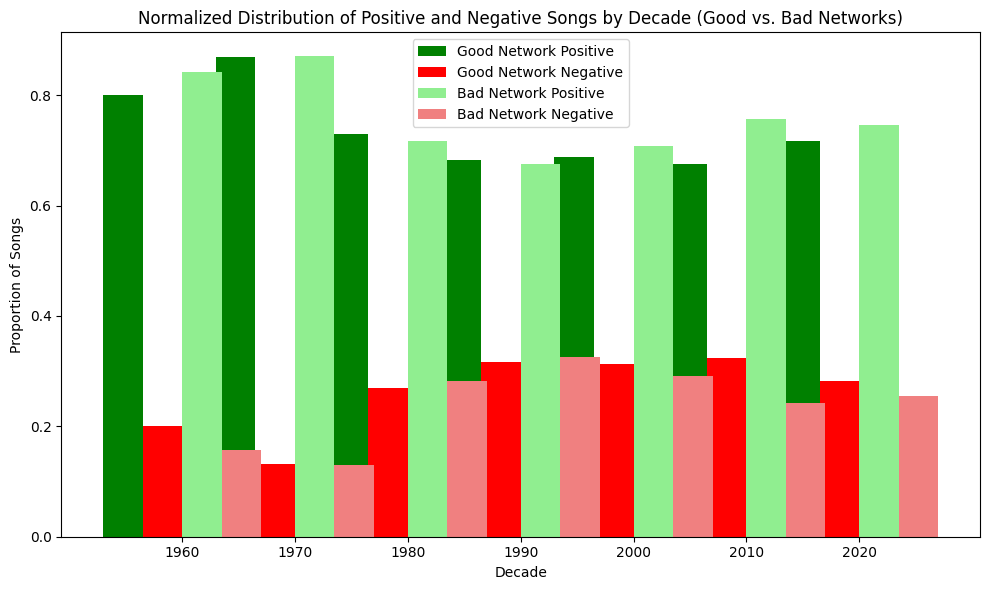

In [205]:
sia = SentimentIntensityAnalyzer()

# Initialize dictionaries to store sentiment counts for each decade and network
good_sentiment_counts = defaultdict(lambda: {"positive": 0, "negative": 0, "total": 0})
bad_sentiment_counts = defaultdict(lambda: {"positive": 0, "negative": 0, "total": 0})

# Function to classify sentiment
def classify_sentiment(text):
    score = sia.polarity_scores(text)
    return "positive" if score['compound'] > 0 else "negative"

# Classify sentiment for each song in the good network
for decade, songs in good_decade_tokens.items():
    for song in songs:
        text = " ".join(song['Tokens'])  # Combine tokens into a single string of text
        sentiment = classify_sentiment(text)
        good_sentiment_counts[decade][sentiment] += 1
        good_sentiment_counts[decade]["total"] += 1

# Classify sentiment for each song in the bad network
for decade, songs in bad_decade_tokens.items():
    for song in songs:
        text = " ".join(song['Tokens'])  # Combine tokens into a single string of text
        sentiment = classify_sentiment(text)
        bad_sentiment_counts[decade][sentiment] += 1
        bad_sentiment_counts[decade]["total"] += 1

# Normalize sentiment counts by total songs in each decade
good_normalized = {decade: {"positive": good_sentiment_counts[decade]["positive"] / good_sentiment_counts[decade]["total"],
                            "negative": good_sentiment_counts[decade]["negative"] / good_sentiment_counts[decade]["total"]}
                   for decade in good_sentiment_counts}

bad_normalized = {decade: {"positive": bad_sentiment_counts[decade]["positive"] / bad_sentiment_counts[decade]["total"],
                           "negative": bad_sentiment_counts[decade]["negative"] / bad_sentiment_counts[decade]["total"]}
                  for decade in bad_sentiment_counts}

# Prepare the data for plotting
decades = list(good_normalized.keys())
good_positive = [good_normalized[decade]["positive"] for decade in decades]
good_negative = [good_normalized[decade]["negative"] for decade in decades]
bad_positive = [bad_normalized[decade]["positive"] for decade in decades]
bad_negative = [bad_normalized[decade]["negative"] for decade in decades]

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Bar plot for positive and negative songs in good and bad networks
width = 0.35  # the width of the bars
x = range(len(decades))

ax.bar(x, good_positive, width, label='Good Network Positive', color='green')
ax.bar([p + width for p in x], good_negative, width, label='Good Network Negative', color='red')

ax.bar([p + 2*width for p in x], bad_positive, width, label='Bad Network Positive', color='lightgreen')
ax.bar([p + 3*width for p in x], bad_negative, width, label='Bad Network Negative', color='lightcoral')

# Add labels and title
ax.set_xlabel('Decade')
ax.set_ylabel('Proportion of Songs')
ax.set_title('Normalized Distribution of Positive and Negative Songs by Decade (Good vs. Bad Networks)')
ax.set_xticks([p + 1.5*width for p in x])
ax.set_xticklabels(decades)
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Sentiment Analysis on the album level

We calculated the distribution of sentiment for each track number in an album to understand how the mood throughout at album. We did this for every decade. By doing this, we can see how consistent the emotions are across the albums and hopefully gain an insight into how good vs. bad albums are built.

#### 1. Sentiment Stability
- **Good albums**: The positive mood stays high (0.7–1.0), with very few or no neutral/negative tracks. This creates a strong and emotional connection with the listener.
- **Bad albums**: The positive mood varies, sometimes going below 0.7. These albums also have more neutral and negative tracks, making them feel less focused or emotionally strong.

#### 2. Impact of Neutral and Negative Sentiments
- **Neutral tracks**: These are rare in good albums but more common in bad ones. Neutral tracks may feel flat or uninspired, which can make the album feel less exciting or emotionally engaging.
- **Negative tracks**: These are rare overall but show up more in bad albums. Negative tracks can disrupt the flow and make the album feel inconsistent.

#### 3. No particular pattern within albums
- Other than the above mentioned, there doesn't seem to be any pattern in how albums are built and how they distribute positive and negative songs throughout an album. What we hoped to see was something along the lines of good albums (contrary) always starting and ending with positive song having negative ones in the middle, but this does not seem to be the case.

In [ ]:
sia = SentimentIntensityAnalyzer()

# Function to classify the sentiment of each song's lyrics
def classify_sentiment(tokens):
    lyrics = ' '.join(tokens)  # Convert tokens back to a string
    sentiment = sia.polarity_scores(lyrics)  # Get sentiment scores
    if sentiment['compound'] >= 0.05:
        return 'positive'
    elif sentiment['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Initialize dictionaries to store the sentiment distribution for each track per decade
good_sentiment_distribution = {decade: [] for decade in range(1960, 2024, 10)}
bad_sentiment_distribution = {decade: [] for decade in range(1960, 2024, 10)}

# --- Classify and Collect Sentiment Counts ---
def collect_sentiment_data(songs, sentiment_distribution):
    for song in songs:
        track_number = song['Track Number']
        tokens = song['Tokens']
        sentiment = classify_sentiment(tokens)  # Classify sentiment
        
        # Ensure there's a list for each track number in the sentiment distribution
        while len(sentiment_distribution) <= track_number - 1:
            sentiment_distribution.append({'positive': 0, 'negative': 0, 'neutral': 0, 'total': 0})
        
        # Update the sentiment distribution for the corresponding track number
        sentiment_distribution[track_number - 1][sentiment] += 1
        sentiment_distribution[track_number - 1]['total'] += 1

# Process good network data
for decade, songs in good_decade_tokens.items():
    collect_sentiment_data(songs, good_sentiment_distribution[decade])

# Process bad network data
for decade, songs in bad_decade_tokens.items():
    collect_sentiment_data(songs, bad_sentiment_distribution[decade])

# --- Normalize Sentiment Distribution ---
def normalize_sentiment_data(sentiment_distribution):
    normalized = []
    for track_data in sentiment_distribution:
        if track_data['total'] > 0:
            normalized.append({
                'positive': track_data['positive'] / track_data['total'],
                'negative': track_data['negative'] / track_data['total'],
                'neutral': track_data['neutral'] / track_data['total']
            })
        else:
            normalized.append({'positive': 0, 'negative': 0, 'neutral': 0})
    return normalized

normalized_good_sentiment = {decade: normalize_sentiment_data(distribution) for decade, distribution in good_sentiment_distribution.items()}
normalized_bad_sentiment = {decade: normalize_sentiment_data(distribution) for decade, distribution in bad_sentiment_distribution.items()}

# Convert normalized data to DataFrames for easier viewing
normalized_good_df = {decade: pd.DataFrame(data) for decade, data in normalized_good_sentiment.items()}
normalized_bad_df = {decade: pd.DataFrame(data) for decade, data in normalized_bad_sentiment.items()}

# Display the results
normalized_good_df, normalized_bad_df


({1960:     positive  negative   neutral
  0   0.823529  0.117647  0.058824
  1   0.727273  0.272727  0.000000
  2   0.833333  0.166667  0.000000
  3   0.727273  0.272727  0.000000
  4   0.900000  0.100000  0.000000
  5   0.769231  0.153846  0.076923
  6   0.833333  0.166667  0.000000
  7   0.909091  0.090909  0.000000
  8   0.800000  0.200000  0.000000
  9   0.909091  0.090909  0.000000
  10  0.555556  0.444444  0.000000
  11  0.833333  0.166667  0.000000
  12  0.000000  1.000000  0.000000
  13  0.000000  1.000000  0.000000,
  1970:     positive  negative  neutral
  0   0.866667  0.133333      0.0
  1   0.750000  0.250000      0.0
  2   0.615385  0.384615      0.0
  3   0.933333  0.066667      0.0
  4   0.928571  0.071429      0.0
  5   0.857143  0.142857      0.0
  6   0.916667  0.083333      0.0
  7   0.900000  0.100000      0.0
  8   1.000000  0.000000      0.0
  9   0.857143  0.142857      0.0
  10  1.000000  0.000000      0.0
  11  1.000000  0.000000      0.0
  12  1.000000  0.00

# Analysis of Emotional Trajectories in Good vs. Bad Albums

We used the NRClex library to classify the emotions in each track from the lyrics. 

Once we had the emotional scores for each song, we looked at the overall emotional feel of the entire album. To do this, we computed the distribution of emotions for each track number for each decade. By looking at this emotional distribution, we could then compare how the emotions in good albums differed from those in bad albums and how albums usually progress in emotion.
---

## Emotional Structure in Good vs. Bad Albums

After analyzing the emotional content of the albums, we found some interesting differences between good and bad albums in how their emotions develop.

### 1. Emotional Progression in Good vs. Bad Albums

In **bad albums**, the emotional distribution across the tracks changes quite a bit. The lines for each emotion often cross over, showing that the emotional feel of the album is inconsistent. This suggests that the album does not have a clear emotional journey, with the emotions bouncing back and forth without any real progression. There is no obvious pattern for how emotions are arranged across the tracks.

On the other hand, **good albums** show a clearer emotional structure. The emotions are more separated, and you can often see that certain emotions dominate in specific sections of the album. In good albums, the emotional feel tends to start on a **high note**, with emotions like **joy** and **anticipation** leading the way. As the album continues, it often moves towards more **sad** or **reflective** emotions by the end. This creates a sense of emotional **progression**, where the listener feels like the album has a story or journey.

### 2. Dominant Emotions in Good and Bad Albums

Across both **good** and **bad albums**, the emotions of **joy** and **anticipation** are usually the most dominant. However, the way these emotions are balanced with others like **fear** and **sadness** is what sets the albums apart. In **good albums**, the emotions move from positive (joy, anticipation) to more complex, sometimes sadder emotions (fear, sadness) as the album progresses. This gives the listener an emotional journey, which is something that is less clear in **bad albums**.

In **bad albums**, the emotions are much more **mixed up**. They don’t follow a smooth or intentional pattern. You might hear happy emotions in one track, and then angry or sad emotions in the next, with no real transition or flow. This makes the album feel **disjointed**, as if there’s no clear path or direction.

### 3. Emotional Patterns Across Decades

We also looked at how the emotions changed over the course of the album, divided into sections we called "decades" (groups of tracks). In **good albums**, we often saw that different emotions dominated each decade. For example, early tracks were often filled with **joy** or **anticipation**, while later tracks shifted to emotions like **fear** or **sadness**. This kind of emotional progression made the album feel like a journey that moved through different moods.

In **bad albums**, we did not see this kind of clear progression. The emotions would change abruptly between tracks, with no real pattern in how the album developed emotionally. The lack of a consistent emotional journey made the experience feel less engaging and more unpredictable.

In [ ]:
# Function to classify emotions using NRCLex
def classify_emotion(tokens):
    lyrics = ' '.join(tokens)  # Convert tokens back to a string
    emotion_scores = NRCLex(lyrics).affect_frequencies  # Get emotion frequencies
    # Ensure all expected emotions are present in the output
    emotions = ['fear', 'anger', 'anticipation', 'trust', 'surprise', 
                'sadness', 'joy', 'disgust', 'positive', 'negative']
    return {emotion: emotion_scores.get(emotion, 0) for emotion in emotions}

# Initialize dictionaries to store the emotion distribution for each track per decade
good_emotion_distribution = {decade: [] for decade in range(1960, 2024, 10)}
bad_emotion_distribution = {decade: [] for decade in range(1960, 2024, 10)}

# --- Classify and Collect Emotion Counts ---
def collect_emotion_data(songs, emotion_distribution):
    for song in songs:
        track_number = song['Track Number']
        tokens = song['Tokens']
        emotion_scores = classify_emotion(tokens)  # Classify emotions
        
        # Ensure there's a list for each track number in the emotion distribution
        while len(emotion_distribution) <= track_number - 1:
            emotion_distribution.append({
                'fear': 0, 'anger': 0, 'anticipation': 0, 'trust': 0, 'surprise': 0, 
                'sadness': 0, 'joy': 0, 'disgust': 0, 'positive': 0, 'negative': 0, 'total': 0
            })
        
        # Update the emotion distribution for the corresponding track number
        for emotion, score in emotion_scores.items():
            emotion_distribution[track_number - 1][emotion] += score
        emotion_distribution[track_number - 1]['total'] += 1

# Process good network data
for decade, songs in good_decade_tokens.items():
    collect_emotion_data(songs, good_emotion_distribution[decade])

# Process bad network data
for decade, songs in bad_decade_tokens.items():
    collect_emotion_data(songs, bad_emotion_distribution[decade])

# --- Normalize Emotion Distribution ---
def normalize_emotion_data(emotion_distribution):
    normalized = []
    for track_data in emotion_distribution:
        if track_data['total'] > 0:
            normalized.append({
                'fear': track_data['fear'] / track_data['total'],
                'anger': track_data['anger'] / track_data['total'],
                'anticipation': track_data['anticipation'] / track_data['total'],
                'trust': track_data['trust'] / track_data['total'],
                'surprise': track_data['surprise'] / track_data['total'],
                'sadness': track_data['sadness'] / track_data['total'],
                'joy': track_data['joy'] / track_data['total'],
                'disgust': track_data['disgust'] / track_data['total'],
                'positive': track_data['positive'] / track_data['total'],
                'negative': track_data['negative'] / track_data['total']
            })
        else:
            normalized.append({
                'fear': 0, 'anger': 0, 'anticipation': 0, 'trust': 0, 'surprise': 0, 
                'sadness': 0, 'joy': 0, 'disgust': 0, 'positive': 0, 'negative': 0
            })
    return normalized

normalized_good_emotion = {decade: normalize_emotion_data(distribution) for decade, distribution in good_emotion_distribution.items()}
normalized_bad_emotion = {decade: normalize_emotion_data(distribution) for decade, distribution in bad_emotion_distribution.items()}

# Convert normalized data to DataFrames for easier viewing
normalized_good_df = {decade: pd.DataFrame(data) for decade, data in normalized_good_emotion.items()}
normalized_bad_df = {decade: pd.DataFrame(data) for decade, data in normalized_bad_emotion.items()}

# Display the results
normalized_good_df, normalized_bad_df


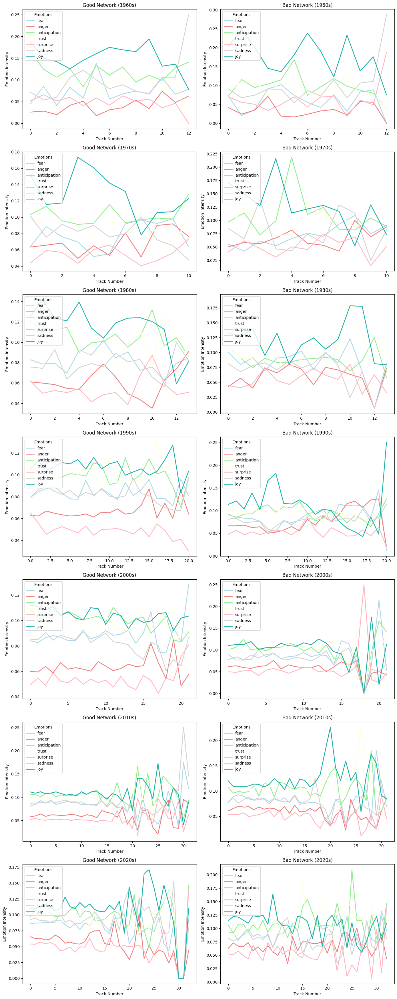

In [265]:
import matplotlib.pyplot as plt
import numpy as np

# Define the color palette for known emotions
emotion_colors = {
    'fear': 'lightblue',
    'anger': 'lightcoral',
    'anticipation': 'lightgreen',
    'trust': 'lightyellow',
    'surprise': 'lightpink',
    'sadness': 'lightgrey',
    'joy': 'lightseagreen'
}

# Function to plot line charts for both good and bad networks for each decade
def plot_line_charts_for_decade(good_df, bad_df, decade, ax_good, ax_bad):
    # Extract only the emotion columns (ensure they are numeric)
    emotions = [col for col in good_df.columns if col in emotion_colors]
    
    # Ensure the track indices are integers (if needed, reset index)
    good_df = good_df[emotions]
    bad_df = bad_df[emotions]
    
    # Check for the number of tracks in each DataFrame
    num_tracks_good = len(good_df)
    num_tracks_bad = len(bad_df)

    # If the number of tracks doesn't match, adjust them
    if num_tracks_good != num_tracks_bad:
        min_tracks = min(num_tracks_good, num_tracks_bad)
        good_df = good_df.iloc[:min_tracks]
        bad_df = bad_df.iloc[:min_tracks]
        print(f"Warning: Mismatch in number of tracks between good and bad networks for the {decade}s. Data adjusted.")
    
    # Convert DataFrames to numpy arrays for easy manipulation
    good_data = good_df[emotions].values
    bad_data = bad_df[emotions].values
    
    # Set the positions for the tracks
    track_indices = np.arange(len(good_df))

    # Function to get color for each emotion
    def get_emotion_color(emotion):
        if emotion in emotion_colors:
            return emotion_colors[emotion]
        else:
            # Handle new emotions by assigning a default color (gray in this case)
            print(f"Warning: {emotion} not in emotion_colors. Using default color.")
            return 'gray'

    # Plot lines for the good network (on the left side)
    for i, emotion in enumerate(emotions):
        ax_good.plot(track_indices, good_data[:, i], label=f'{emotion}', 
                    color=get_emotion_color(emotion), linestyle='-', linewidth=2)
    ax_good.set_title(f'Good Network ({decade}s)')
    ax_good.set_xlabel('Track Number')
    ax_good.set_ylabel('Emotion Intensity')
    
    # Plot lines for the bad network (on the right side)
    for i, emotion in enumerate(emotions):
        ax_bad.plot(track_indices, bad_data[:, i], label=f'{emotion}', 
                   color=get_emotion_color(emotion), linestyle='-', linewidth=2)  # Solid line for bad network
    ax_bad.set_title(f'Bad Network ({decade}s)')
    ax_bad.set_xlabel('Track Number')
    ax_bad.set_ylabel('Emotion Intensity')

    # Add legend for both plots
    ax_good.legend(title='Emotions', loc='upper left')
    ax_bad.legend(title='Emotions', loc='upper left')

# Create a figure with subplots arranged in two columns for each decade
fig, axes = plt.subplots(len(normalized_good_df), 2, figsize=(14, 5 * len(normalized_good_df)))

# Loop through each decade and create side-by-side plots for the good and bad networks
for i, decade in enumerate(normalized_good_df.keys()):
    plot_line_charts_for_decade(normalized_good_df[decade], normalized_bad_df[decade], decade, 
                                axes[i, 0], axes[i, 1])

# Automatically adjust layout to prevent overlap of labels and titles
plt.tight_layout()

# Show the plot
plt.show()


---

# Top 100 songs between 2000 and 2020

Author: Patrick Jensen Martins (s204748)

In this section we investigate the relationships between top performing artists, based on their songs ratings in a top 100 best singles list, from the year 2000 to 2023. We also investigate further the sentiment of songs throughout each decade, between 2000 and 2020.

Import libraries

In [351]:
import requests
import json
import pandas as pd
import urllib.request
import regex as re
import time
import os
import re
import os
import math
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from fa2_modified import ForceAtlas2
import urllib.request
import json
from bs4 import BeautifulSoup
#from community import best_partition
import networkx as nx
import matplotlib.pyplot as plt
from infomap import Infomap

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from string import punctuation
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string
from collections import defaultdict
#from wordcloud import WordCloud
from collections import Counter
import math
#from community import community_louvain
import seaborn as sns
import itertools
from fa2_modified import ForceAtlas2
from nltk.sentiment.vader import SentimentIntensityAnalyzer

## Collecting the data

We wish to investigate the relationship of the top 100 songs between 2000 and 2020.

The data for the top 100 songs for each year is extracted from the Wikipedia pages named "Billboard Year-End Hot 100 singles of [year]".

The content of each page is saved into a dictionary. Each key in the dictionary represents the year and is linked to the content in the wiki page.

In [353]:
baseurl = "https://en.wikipedia.org/w/api.php?"
action = "action=query"

contents_dict = {}

# save content in pages to a dictionary for each year
for i in range(2000, 2023+1):
    title = f"titles=Billboard_Year-End_Hot_100_singles_of_{i}"
    content = "prop=revisions&rvprop=content"
    dataformat ="format=json"

    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)

    text = urllib.request.urlopen(query).read().decode('utf-8')

    contents_dict[i] = text


We go through the content of each page and with the help of regular expressions, the rank, song name and artist details are extracted and saved into a list of songs associated to each year, contained in a dictionary.

In [358]:
# Collect all songs for each year
ratings_collection = {}
for year, content in contents_dict.items():
    if year <= 2020:
        song_ratings = re.findall(r'[\][n]\|(\d+(?=\d*))(?:.+?)\[(?:[^\[\|\]]*\|)?([^\[\|\]]+?)\]\](?:.+?)\[\[(.*?)\]\]', content)
    # used only for artists network
    else:
        song_ratings = re.findall(r'(\d+(?=\d*))(?:.+?)\[(?:[^\[\|\]]*\|)?([^\[\|\]]+?)\]\](?:.+?)\[\[(.*?)\]\]', content)

    
    songs_cleaned = song_ratings

    # last 100 ranking item is the right one
    right_top100 = ""
    for (rank, song, artist) in reversed(songs_cleaned):
        if int(rank) == 100:
            right_top100 = (rank, song, artist)
            break

        if song == "Heat Waves":
            print("Heat Waves")
            print(rank, song, artist)
    
    # remove items that shouldn't have 100 rating
    for (rank, song, artist) in reversed(songs_cleaned):
        if int(rank) == 100 and right_top100!= (rank, song, artist):
            songs_cleaned.remove((rank, song, artist))
        
    

    # sort ranking
    songs_cleaned.sort(key=lambda x: int(x[0]))
    
    # remove unrelated items
    for (rank, song, artist) in songs_cleaned:
        if int(rank) >100 or int(rank) < 1:
            songs_cleaned.remove((rank, song, artist))

    # remove duplicates
    songs_cleaned = list(set(dict.fromkeys(songs_cleaned)))

    # sort ranking
    songs_cleaned.sort(key=lambda x: int(x[0]))

    # save cleaned data
    ratings_collection[year] = songs_cleaned

    

songs_df = pd.DataFrame(ratings_collection[2020], columns=['Rank', 'Song', 'Artist'])

## check if the last item and first is the right one 
# for (rank, song, artist) in ratings_collection[2001]:
#     if int(rank) == 1:
#         print(rank, song, artist)
#     if int(rank) == 100:
#         print(rank, song, artist)
print("Billboard Year-End Hot 100 singles of 2020")
songs_df[:10]


Billboard Year-End Hot 100 singles of 2020


,Rank,Song,Artist
0,1,Blinding Lights,The Weeknd
1,2,Circles,Post Malone
2,3,The Box,Roddy Ricch
3,4,Don't Start Now,Dua Lipa
4,5,Rockstar,DaBaby
5,6,Adore You,Harry Styles
6,7,Life Is Good,Future (rapper)|Future
7,8,Memories,Maroon 5
8,9,The Bones,Maren Morris
9,10,Someone You Loved,Lewis Capaldi


Using the lyricsgenius API, we are able to extract the lyrics for each song given the song names and respective artists that were extracted.

We only download the lyrics for the top 10 songs of each year, due to constraints in the API requests.

In [247]:
import lyricsgenius

client_access_token = "FZyxPjY4GKltQjpyKulBfJZwwZWHNySpmbSOtRN1ELpB9MV5b2GSsh6i1dQEgvse"

access_token = client_access_token

# Initialize Genius client
genius = lyricsgenius.Genius(access_token, timeout=30)

# dictionary to collect lyrics
lyrics_collection = {}

# initialize dictionary
for y in range(2000, 2023+1):
    lyrics_collection[y] = []

# 
for y in range(2000, 2023+1):
    # get lyrics for the 10 top songs
    for e in ratings_collection[y][:10]:
        print("HERE")
        print(y)
        print(e)

        i = ratings_collection[y].index(e)
        (rank, song, artist) = e
        # Search song
        song_genius = genius.search_song(song, artist)

        # Exclude first line which states contributions
        if song_genius is not None:
            lyrics = "\n".join(song.lyrics.split('\n')[1:])
        else:
            lyrics = ""
            print("SONG NOT FOUND")


        lyrics_collection[y].append((rank, song, artist, lyrics))

        time.sleep(4)




HERE
2000
('1', 'Breathe', 'Faith Hill')
Searching for "Breathe" by Faith Hill...
Done.
HERE
2000
('2', 'Smooth', 'Santana (band)|Santana')
Searching for "Smooth" by Santana (band)|Santana...
Done.
HERE
2000
('3', 'Maria Maria', 'Santana (band)|Santana')
Searching for "Maria Maria" by Santana (band)|Santana...
Done.
HERE
2000
('4', 'I Wanna Know', 'Joe (singer)|Joe')
Searching for "I Wanna Know" by Joe (singer)|Joe...
Done.
HERE
2000
('5', 'Everything You Want', 'Vertical Horizon')
Searching for "Everything You Want" by Vertical Horizon...
Done.
HERE
2000
('6', 'Say My Name', "Destiny's Child")
Searching for "Say My Name" by Destiny's Child...
Done.
HERE
2000
('7', 'I Knew I Loved You', 'Savage Garden')
Searching for "I Knew I Loved You" by Savage Garden...
Done.
HERE
2000
('8', 'Amazed', 'Lonestar')
Searching for "Amazed" by Lonestar...
Done.
HERE
2000
('9', 'Bent', 'Matchbox Twenty')
Searching for "Bent" by Matchbox Twenty...
Done.
HERE
2000
('10', "He Wasn't Man Enough", 'Toni Braxt

Lyrics are saved locally to guarantee future access.

In [255]:


for y in range(2000, 2023+1):
    # get lyrics for the 10 top songs
    for e in lyrics_collection[y]:

        i = lyrics_collection[y].index(e)
        (rank, song, artist, lyrics) = e

        # create the full path for the file
        file_path = os.path.join("./lyrics/", str(song)[:10] + ".txt")

        # create a new text file
        with open(file_path, 'w') as file:
            pass

        with open(file_path, 'w') as f:
            f.write(lyrics)



        

# Analyzing a network of top songs from 2000 to 2020

We wish to investigate the modelling of the top 100 songs into a network.

The network is an undirected graph, in which each node is an artist and an artist is connected to another one if both have a song which belongs to the top 100 list for the same year.

In [365]:
# create undirected graph
artists_network = nx.Graph()

# create list of artists for each year
artistsByYear = [[]]*24

# initialize dictionary
for y in range(0, 23+1):
    artistsByYear[y] = []

for y in range(2000, 2023+1):
    # get lyrics for the 10 top songs
    for i,e in enumerate(ratings_collection[y]):
        (rank, song, artist) = e
        # save artist to list
        artistsByYear[y-2000].append(artist)

        # add node to network
        artists_network.add_node( artist ) 

for year in artistsByYear:
    for i in range(len(year)):
        for j in range(len(year)):
            if i != j and year[i]!= year[j]:
                # Connect artists
                artists_network.add_edge(year[i], year[j])


The network is plotted using the ForceAtlas 2 algorithm.

100%|██████████| 10000/10000 [00:31<00:00, 320.16it/s]


BarnesHut Approximation  took  10.11  seconds
Repulsion forces  took  16.33  seconds
Gravitational forces  took  0.18  seconds
Attraction forces  took  2.78  seconds
AdjustSpeedAndApplyForces step  took  0.97  seconds


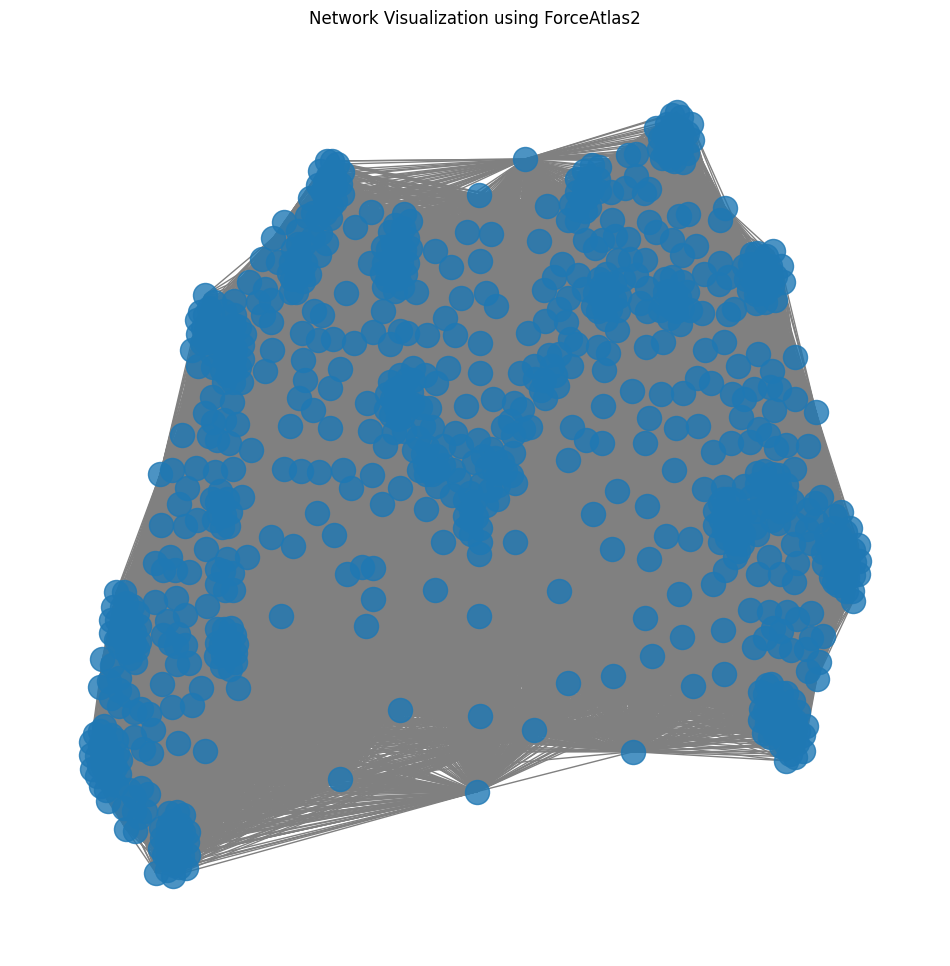

In [366]:


# Step 3: Use the ForceAtlas2 algorithm to compute node layout
forceatlas2 = ForceAtlas2(
    outboundAttractionDistribution=True,  # Dissuade hubs
    linLogMode=False,  # Use linear distances
    adjustSizes=False,  # Prevent overlap
    edgeWeightInfluence=1.0,
    jitterTolerance=1.0,
    barnesHutOptimize=True,
    barnesHutTheta=1,
    scalingRatio=75,
    strongGravityMode=False,
    gravity=3,
    verbose=True
)

positions = forceatlas2.forceatlas2_networkx_layout(artists_network, pos=None, iterations=10000)

# Draw the network graph
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(
    artists_network, 
    pos=positions,  
    alpha=0.8,
)
nx.draw_networkx_edges(
    artists_network, 
    pos=positions, 
    edge_color="gray"
)

plt.title("Network Visualization using ForceAtlas2")


plt.axis('off')  # Hide axes
plt.show()

We get the 10 artists with the highest degree in the network.

In [367]:
 # Calculate degrees of all nodes
degrees = artists_network.degree()

# Sort nodes based on degrees
sorted_nodes = sorted(degrees, key=lambda x: x[1], reverse=True)

# for i in degrees:
#     print(i[1])

# Get top 5 nodes
top_5_nodes = sorted_nodes[:10]

top_5_nodes_df = pd.DataFrame(top_5_nodes, columns=['Artist', 'Degree'])

top_5_nodes_df

,Artist,Degree
0,Taylor Swift,595
1,Maroon 5,561
2,Mariah Carey,554
3,Pink (singer)|Pink,540
4,Eminem,516
5,Chris Brown,507
6,Rihanna,505
7,Nelly,490
8,Drake (musician)|Drake,483
9,Beyonc\u00e9,459


This likely reveals the 10 most influential artists in the 2000's so far. These artists are hubs in the network since they contain a larger ammount of edges connected to them.

With the structure of the network defined, we proceed to examine if it is a scale-free network. 

This can be observed by the degree distributions.

We first plot the degree distributions in the log-log scale.

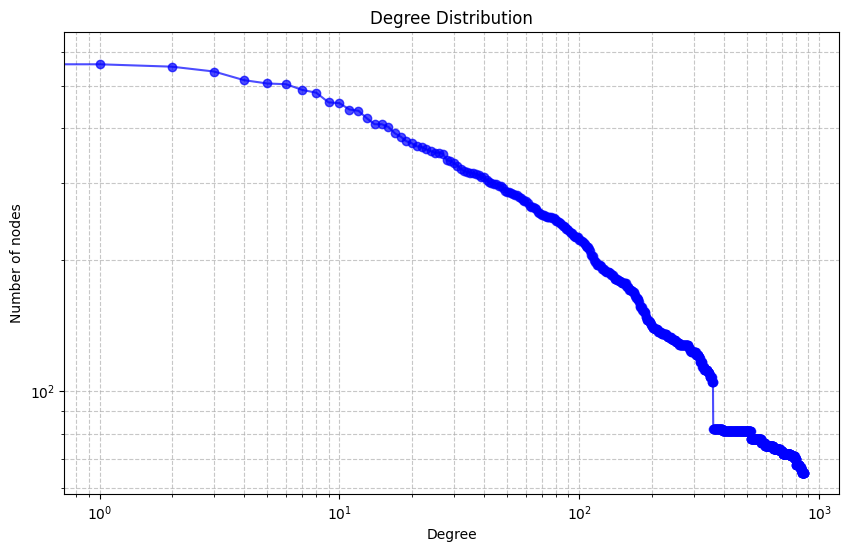

In [429]:
from collections import Counter
import collections
import powerlaw


degree_sequence = sorted([d for n, d in artists_network.degree()], reverse=True)  # degree sequence

plt.figure(figsize=(10, 6))

plt.loglog(degree_sequence, 'bo-', alpha=0.7)
plt.xlabel('Degree')
plt.ylabel('Number of nodes')
plt.title('Degree Distribution')
plt.grid(True, which='both', linestyle='--', alpha=0.7)

plt.show()


We can observe that the distribution does not entirely follow the pattern of a straight line, which is typical for power law distributions. However, we could argue that there is some behaviour that indicates that the network behaves as a scale free network, since a straight line could be fitted for the region where a great fraction of nodes is concentrated (in the center), with a low error. Most important of all, the plot demonstrates how most nodes contain a smaller number os connections, and that this population decreases for higher degrees.

We then calculate the power-law coefficient, by fitting a power law distribution to the distribution of edges in the network:

In [439]:
from powerlaw import Fit
import powerlaw


fit = powerlaw.Fit(degree_sequence)

print(f"Alpha: {fit.alpha}")

Calculating best minimal value for power law fit
Alpha: 4.63741392783498


The power-law coefficient value is higher than $4$. This indicates that there is a long tail with rare high value datapoints. This can be confirmed in the plot presented before. This phenomenon can typically occur for scale free networks, which are often characterized by having many outliers [1].

# Sentiment for the top 10 songs between 2000 and 2020

Now that we have a network of artists, we wish to inspect the evolving sentiment of the top 10 songs from each year between 2000 and 2020.

We want to investigate if there were any significant shifts in sentiment during this timeline, for the most popular songs.

We define functions for removing punctuation from a list of tokens, and tokenizing lines of the sentiment scores text file, which contains all of the data used to calculate sentiment for each song.

In [330]:
def tokenize_lines(file_path):
    # Initialize an empty list to store the tokenized lines
    tokenized_data = []
    
    try:
        # Open the file in read mode
        with open(file_path, 'r') as file:
            # Iterate through each line in the file
            for line in file:
                # Strip leading/trailing whitespace and split into tokens
                tokens = line.strip().split()
                
                # Add the tokenized line to our master list
                tokenized_data.append(tokens)
        
        return tokenized_data
    
    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
        return []
    
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return []

# remove punctuation from lyrics    
def remove_pure_punctuation (list_strings):
    return [s.translate(str.maketrans('', '', punctuation)) for s in list_strings if any(c not in (punctuation + '—') for c in s) or len(s)==0]

Collect list of all the words (happy_words) which have a sentiment score to them, as well as their respective sentiment scores (happy_rates).

In [498]:
# Access happy words and their rankings
file_path = './Data_Set_S1.txt'
tokenized_result = tokenize_lines(file_path)


# save happy words and respective ratings in different arrays
happy_words = []
happy_rates = []

for i, tokens in enumerate(tokenized_result[4:]):  # from 5th line
    print(tokens)
    happy_words.append(tokens[0])
    happy_rates.append(float(tokens[2]))

# adjust happy_rates so that the highes the rank, the more points a word gets.
# total_ranks = len(happy_rates)
# happy_rates = [abs(float(rate) - total_ranks) for rate in happy_rates]




['laughter', '1', '8.50', '0.9313', '3600', '--', '--', '1728']
['happiness', '2', '8.44', '0.9723', '1853', '2458', '--', '1230']
['love', '3', '8.42', '1.1082', '25', '317', '328', '23']
['happy', '4', '8.30', '0.9949', '65', '1372', '1313', '375']
['laughed', '5', '8.26', '1.1572', '3334', '3542', '--', '2332']
['laugh', '6', '8.22', '1.3746', '1002', '3998', '4488', '647']
['laughing', '7', '8.20', '1.1066', '1579', '--', '--', '1122']
['excellent', '8', '8.18', '1.1008', '1496', '1756', '3155', '--']
['laughs', '9', '8.18', '1.1551', '3554', '--', '--', '2856']
['joy', '10', '8.16', '1.0568', '988', '2336', '2723', '809']
['successful', '11', '8.16', '1.0759', '2176', '1198', '1565', '--']
['win', '12', '8.12', '1.0812', '154', '3031', '776', '694']
['rainbow', '13', '8.10', '0.9949', '2726', '--', '--', '1723']
['smile', '14', '8.10', '1.0152', '925', '2666', '2898', '349']
['won', '15', '8.10', '1.2164', '810', '1167', '439', '1493']
['pleasure', '16', '8.08', '0.9655', '1497', 

Compute the average sentiment scores for each year, of the lyrics from the top 10 songs.

In [502]:
def compute_sentiment_score(lyrics, happy_words, happy_rates ):

    # Tokenize the lyrics
    tokens = word_tokenize(lyrics)

    # Convert tokens to lowercase
    tokens = [token.lower() for token in tokens]

    # Remove punctuation from tokens
    tokens = remove_pure_punctuation(tokens)

    # lemmatize tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    freq_tokens = nltk.FreqDist(tokens)

    sent_words = 0
    happiness = 0

    # Calculate sentiment
    for w, frequency in freq_tokens.items():
        
        # sum the sentiment of all words and count the words with sentiment scores
        if w in happy_words:
            i = happy_words.index(w)
            happiness += int(happy_rates[i])*frequency
            sent_words += frequency
    # calculate the average sentiment score
    if sent_words > 0:
        sentiment = happiness/sent_words
    else: sentiment = 0

    return sentiment

In [503]:
sentiments = {}
for y in range(2000, 2020+1):
    sentiments[y] = []

for y in range(2000, 2020+1):

    # get lyrics for the 10 top songs
    for i, e in enumerate(lyrics_collection[y][:10]):

        (rank, song, artist, lyrics) = e

        if lyrics != "":

            sentiment = compute_sentiment_score(lyrics, happy_words, happy_rates)

            sentiments[y].append(sentiment)
            #sentiments[y].append(sent2)

Finally, we plot the average sentiment scores for each year.

[5.034196119686132, 4.986261009239746, 4.9476423563919125, 4.980356108630093, 4.967631396947043, 4.952770889740405, 4.979026525131328, 5.061402116026894, 4.990671676530883, 5.011153864647879, 4.968052176248565, 4.984720269510781, 4.981362428496008, 4.9620876365550375, 5.010529666141326, 5.124933963088193, 4.931763083314398, 4.964892143339838, 5.022962337560397, 4.912972242549108, 4.908521923512749]
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020]


/var/folders/4l/6stdwbh56pvgwz8thwnlgtq80000gn/T/ipykernel_76262/3544257217.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


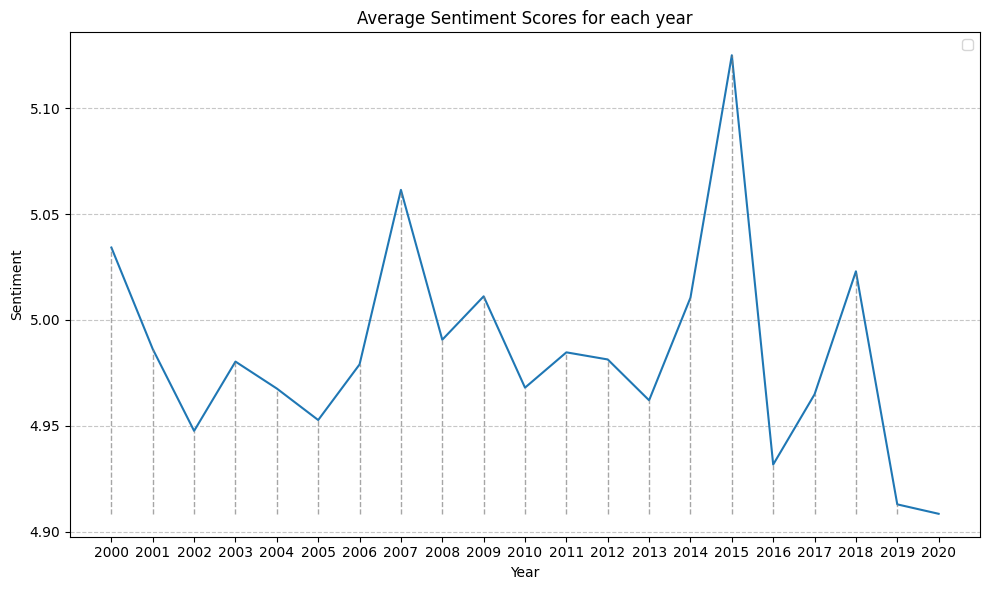

In [504]:
avg_sentiments = []

for i, e in sentiments.items():
    avg_sentiments.append(sum(e)/len(e))
print(avg_sentiments)

# Create histogram
plt.figure(figsize=(10, 6))
bins = np.arange(2000, 2020 + 1, 1)
# plt.bar(bins, avg_sentiments, width=1)
plt.plot(bins, avg_sentiments)

print(bins)

# Customize plot
plt.title('Average Sentiment Scores for each year')
plt.xlabel('Year')
plt.ylabel('Sentiment')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.xticks(range(2000, 2020+1))

# Add vertical lines at each x-axis datapoint
plt.vlines(bins, ymin=min(avg_sentiments), ymax=avg_sentiments, colors='gray', linestyles='dashed', linewidths=1, alpha=0.7)

# Show the plot
plt.show()

In [565]:
print('Average sentiment for first decade: ', np.mean(avg_sentiments[:10]))
print('Average sentiment for second decade: ', np.mean(avg_sentiments[10:20]))

Average sentiment for first decade:  4.991111206297232
Average sentiment for second decade:  4.986427594680365


There is a noticeable trend, where in every two years, on average, there is a slight drop in the average sentiment scores of top listed songs. In the year of 2015 there is a significant peak of the average sentiment score, compared to all other years. There could be external factors contributing to such a dramatic increase, such as political, historic or cultural one. External societal factors combined with the genres of the songs that ended on top could have played an important role on the audience's preference towards music with more positive sentiment in 2015.

Also, although the average sentiment throughout both decades is similar, there is a slight reduction in the value. One might wonder if this is a trend that will follow up in the next decade, with the average sentiment, for the current decade we are living, perhaps decreasing further.

# Sentiment score and word lemmatization for the songs of the top 9 artists in the network

For the final part of this section, we will investigate how the sentiment scores vary through the top performing artists from the network, for the top 9 artists.

In [550]:
artists_songs = {}

# lst_years = [top_2000['Artist'][:5], top_2010['Artist'][:5], top_2020['Artist'][:5]]
lst_years = [top_5_nodes_df['Artist']]

for lst in lst_years:
    for artist in lst:
        # print(artist)
        # search for songs over all years
        for y, e in lyrics_collection.items():
            # go through each song in a year
            for i, (rank, song, a, lyrics) in enumerate(e):

                # add song if the artist is the same
                if a == artist or (a in artist) or (artist in a):
                    if artist not in artists_songs:
                        artists_songs[artist] = []
                    artists_songs[artist].append(lyrics)

# print(len(artists_songs["Destiny's Child"]))

# calculate sentiment
top_artists_sentiment = []

for art, songs in artists_songs.items():

    sentiments_temp = []
    for s in songs:

        if s != "" or s != None or s != " ":
            sentiment = compute_sentiment_score(s, happy_words, happy_rates)

            sentiments_temp.append(sentiment)
            
    
    # compute the average sentiment for the artist's top songs
    top_artists_sentiment.append( (art, sum(sentiments_temp)/len(sentiments_temp), len(songs)) )


#pd.DataFrame(top_artists_sentiment, columns=['Sentiment'])

We exclude the $10^{th}$ artist, Beyonce, because there were no lyrics available. 

Below we show the table containing the artists and the average sentiment score for their songs.

In [563]:
top_artists = pd.DataFrame(top_artists_sentiment, columns=['Artist', 'Sentiment', 'Number of Songs'])
top_artists[:9]


,Artist,Sentiment,Number of Songs
0,Taylor Swift,4.935060,3
1,Maroon 5,5.035761,7
2,Mariah Carey,4.977570,1
3,Pink (singer)|Pink,4.796167,1
4,Eminem,4.848259,1
5,Chris Brown,5.134006,1
6,Rihanna,5.010638,3
7,Nelly,4.973154,4
8,Drake (musician)|Drake,4.857622,2


We can verify that the sentiment is not necessarily higher proportionally with the rank of the artist in the network. The scores are contained in a narrow interval, which shows that there might be some correlation between the range of sentiment score within which a song is hit with its lyrics, and the it's performance success throughout the year.

Tho end this section, we briefly inspect the word clouds of the songs from the top 3 artists with highest degree in the network.

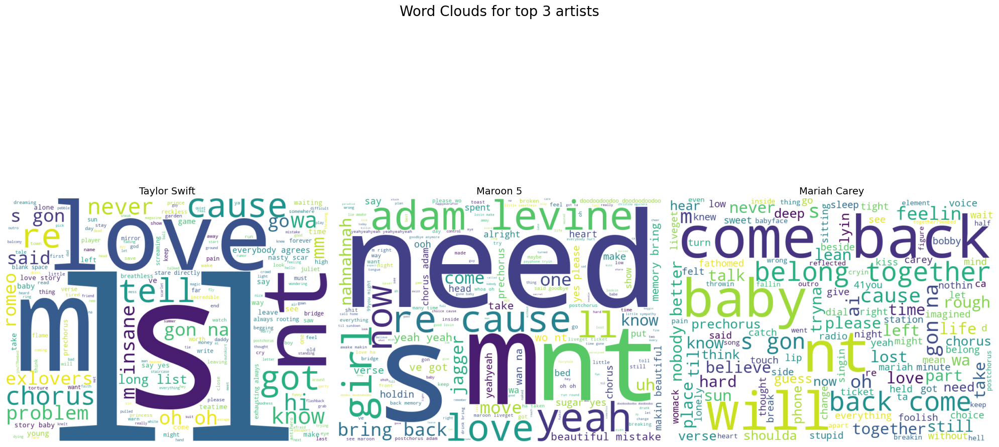

In [562]:
from wordcloud import WordCloud

fig, axes = plt.subplots(1, 3, figsize=(20, 12))  # 1 row, 3 columns
fig.suptitle("Word Clouds for top 3 artists", fontsize=20)

all_lyrics = []
for idx, artist in enumerate(top_artists['Artist'][:3]):
    all_lyrics = []
    combined_l = ' '.join(artists_songs[artist])

    # Tokenize the lyrics
    tokens = word_tokenize(combined_l)

    # Convert tokens to lowercase
    tokens = [token.lower() for token in tokens]

    # Remove punctuation from tokens
    tokens = remove_pure_punctuation(tokens)

    # lemmatize tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    text = ' '.join(tokens)
    
    # Create word cloud
    wordcloud = WordCloud(width=800, height=600, background_color='white').generate(text)
    
    ax = axes[idx]  # Access the correct subplot axis
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(artist, fontsize=14)  # Set title for each decade
    ax.axis("off")  # Hide axes
plt.tight_layout(rect=[0, 0, 1, 0.95]) 
plt.show()

By looking at the wordclouds for the top 3 artists above, it strikes that the word "love" has a significant presence in two of them. There are other words that can be connected to love or togetherness, which have a significant weight, such as "exlover", "need", "girl", "now", "come back" "bring back", "baby" and "belong together". In general, the artists seem to transmit some the concepts of unification and togetherness in society through their music, more specifically, in the lyrics of their songs.

# References

[1] G. Christopher Crawford, Harry Joo, Herman Aguinis,
Under the weight of heavy tails: A power law perspective on the emergence of outliers in entrepreneurship,
Journal of Business Venturing Insights,
Volume 21,
2024,
e00447,
ISSN 2352-6734,
https://doi.org/10.1016/j.jbvi.2023.e00447.
(https://www.sciencedirect.com/science/article/pii/S2352673423000768)
Abstract: A fundamental discovery in entrepreneurship is that firm outcomes do not follow a symmetrical Gaussian curve. Instead, most are heavily right-skewed distributions in which a few extreme outliers (e.g., rock star firms like Airbnb, Tesla, and Uber) account for a disproportionate amount of the output. Although past research usually described outcome distributions as shaped following the power law, our study asks the following question: What other less extreme distributions of generalizable firm outcomes exist in entrepreneurship? Our investigation leverages four representative datasets from the U.S., Europe, and Australia, comprising 32 samples with about 22,000 ventures. We implemented a precise data-analytic approach that compares each sample (i.e., empirical distribution) against multiple theoretical distribution shapes to identify the best fit. Results showed that, across nearly all samples, the pure power law was not the dominant distribution. Instead, the annual revenue distribution is shaped as a power law with an exponential cutoff, and the number of employees distribution is shaped lognormally. Combined, these suggest the existence of top-down limitations on the highest performing firms. Accordingly, we offer an agenda for future research focused on (a) identifying and releasing systemic constraints, (b) examining and falsifying the underlying generative mechanisms that cause the emergence of heavy-tailed distributions and the outliers therein, and (c) conducting multi-level, mixed-method studies to investigate how micro-level interactions aggregate into macro-level heavy-tailed distributions. Our paper makes significant contributions to the power law perspective and future efforts to explain and predict the emergence of rock star firms in entrepreneurship.
Keywords: Generalizable outcomes; Generative mechanisms; Heavy-tailed distributions; Outliers; Power law perspective